# MCD-1 - Técnicas de predicción: Series Temporales (2022-23)

# Notebook 1 -Visualización

## Practica 3

Gozde Yazganoglu

#### Importacion de Librerías

In [89]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.pyplot as plt
from sktime.utils.plotting import plot_series, plot_correlations

import warnings
warnings.filterwarnings('ignore')

#### Reading the data

In [90]:
data = pd.read_csv('../data/datos.csv')
data

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday
0,T1a,5,2015-07-31,11075,915,1,1,0,1
1,T1b,5,2015-07-31,12602,1414,1,1,0,1
2,T1c,5,2015-07-31,5425,453,1,1,0,1
3,T2a,5,2015-07-31,10483,1223,1,1,0,1
4,T2b,5,2015-07-31,6456,595,1,1,0,1
...,...,...,...,...,...,...,...,...,...
9231,T2c,2,2013-01-01,0,0,0,0,a,1
9232,T3a,2,2013-01-01,0,0,0,0,a,1
9233,T3b,2,2013-01-01,0,0,0,0,a,1
9234,T3c,2,2013-01-01,0,0,0,0,a,1


In [91]:
data.dtypes

Store            object
DayOfWeek         int64
Date             object
Sales             int64
Customers         int64
Open              int64
Promo             int64
StateHoliday     object
SchoolHoliday     int64
dtype: object

Alguno de los valores de tiendas nos parace 'a' en vez de ser 1 o 0. Podemos processar juntos.

In [92]:
data['StateHoliday'].unique()

array(['0', 'a', 'b', 'c'], dtype=object)

In [93]:
data[data['StateHoliday']== 'a'].head()

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday
571,T1b,4,2015-06-04,0,0,0,1,a,0
574,T2b,4,2015-06-04,0,0,0,1,a,1
577,T3b,4,2015-06-04,0,0,0,1,a,1
670,T1a,1,2015-05-25,0,0,0,0,a,0
671,T1b,1,2015-05-25,0,0,0,0,a,0


Valores a, b, c deberia representar dias bancarias. Todo los dias a, b, c las tiendas son cerradas en todas conduciones. Podemos convertirse a 1

In [94]:
#Some columns in the data frame has boolean values but have values like a, b, c.

def process_columns(df, columns):
    """Replace null values with 0 and change the data type to int for the specified columns."""
    for col in columns:
        df[col] = df[col].fillna(0)
        df[col] = df[col].replace({'a': 1, 'b':1, 'c':1})
        df[col] = df[col].astype(int)
    return df.dtypes

cols = ['StateHoliday']

process_columns(data, cols)

Store            object
DayOfWeek         int64
Date             object
Sales             int64
Customers         int64
Open              int64
Promo             int64
StateHoliday      int64
SchoolHoliday     int64
dtype: object

In [68]:
def check_missing_feautre(df):
    print('Missing values and datatypes of dataframe')
    df_dtypes = pd.merge(df.isnull().sum(axis = 0).sort_values().to_frame('missing_value').reset_index(),
         df.dtypes.to_frame('feature_type').reset_index(),
         on = 'index',
         how = 'inner')
    return(df_dtypes)
check_missing_feautre(data)


Missing values and datatypes of dataframe
Missing values and datatypes of dataframe


,index,missing_value,feature_type
0,DayOfWeek,0,int64
1,Sales,0,int64
2,Customers,0,int64
3,Open,0,int64
4,Promo,0,int64
5,StateHoliday,0,int64
6,SchoolHoliday,0,int64


Para todo los analisis que queremos hacer habrá que fijar indice a tiempo.

In [10]:
data['Date'] = pd.to_datetime(data['Date'])
data = data.set_index('Date')
data.head()

,Store,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday
Date,,,,,,,,
2015-07-31,T1a,5,11075,915,1,1,0,1
2015-07-31,T1b,5,12602,1414,1,1,0,1
2015-07-31,T1c,5,5425,453,1,1,0,1
2015-07-31,T2a,5,10483,1223,1,1,0,1
2015-07-31,T2b,5,6456,595,1,1,0,1


## 1. Graficar ventas diarias en 10 tiendas

In [11]:
# Filtering dataframe for 10 tiendas
df_T1a= data[data['Store']== 'T1a'].sort_index()
df_T1b= data[data['Store']== 'T1b'].sort_index()
df_T1c= data[data['Store']== 'T1c'].sort_index()
df_T2a= data[data['Store']== 'T2a'].sort_index()
df_T2b= data[data['Store']== 'T2b'].sort_index()
df_T2c= data[data['Store']== 'T2c'].sort_index()
df_T3a= data[data['Store']== 'T3a'].sort_index()
df_T3b= data[data['Store']== 'T3b'].sort_index()
df_T3c= data[data['Store']== 'T3c'].sort_index()
df_T3d= data[data['Store']== 'T3d'].sort_index()

Las tiendas están cerradas en los dias que tienen vacaciones o domingos. Eso no significa que son valores nulos. Como queremos saber la rutina y el volumen de ventas totales semanales, no podemos reemplazar con otros valores. Por ejemplo reemplazar con media puede resultar con sobre estima de ventas semanales. Adamas, el sabado y el lunes tienen rutinas distintas, tampoco no tiene sentido pponer un valor anterior o siguente o media de las dos. Por eso, yo creo que no deberiamos sustituir con ningun valores para poder predecir bien.

Nuestro objetivo es ventas,  'Sales' pero esperemos que numero de clientes 'Customers' tambien es un importante comportamiento de ventas. Cantidad de clientes tiene un afecto directo a cantidad de ventas. 

'Promo' puede ser un variable importante. Las ventas en general suben cuando hay una promocion. Podemos mirar a data si diás con promoción si tiene alguna compartamiento seasonal. Algunos empresas tienen promocionales estacionales.

### Tienda 1a

(<Figure size 1200x800 with 3 Axes>,
 array([<AxesSubplot:ylabel='SchoolHoliday'>,
        <AxesSubplot:title={'center':'Autocorrelation'}>,
        <AxesSubplot:title={'center':'Partial Autocorrelation'}>],
       dtype=object))

<Figure size 1500x500 with 0 Axes>

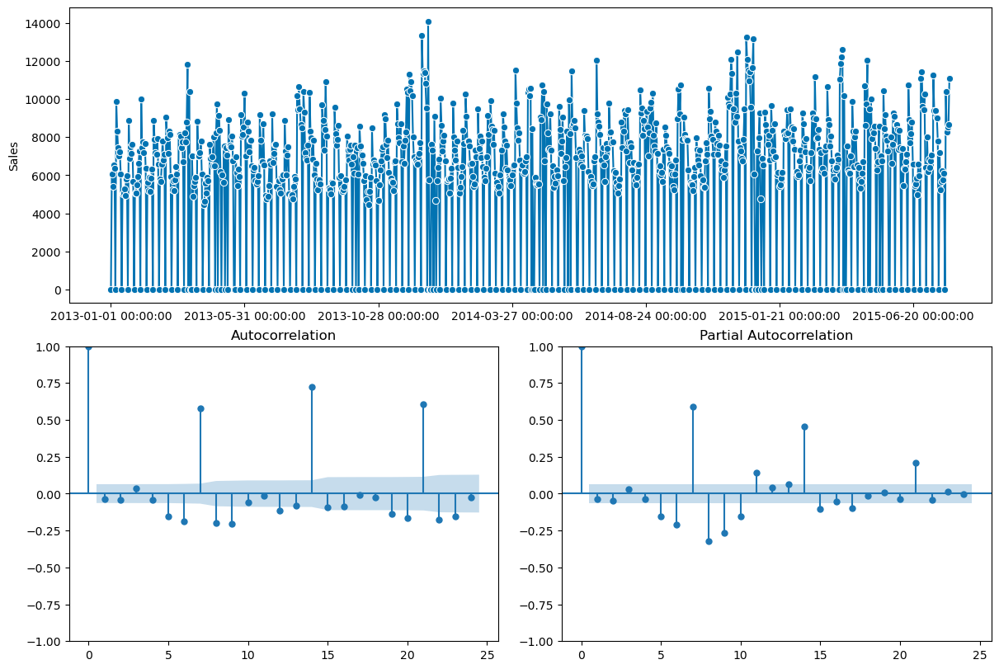

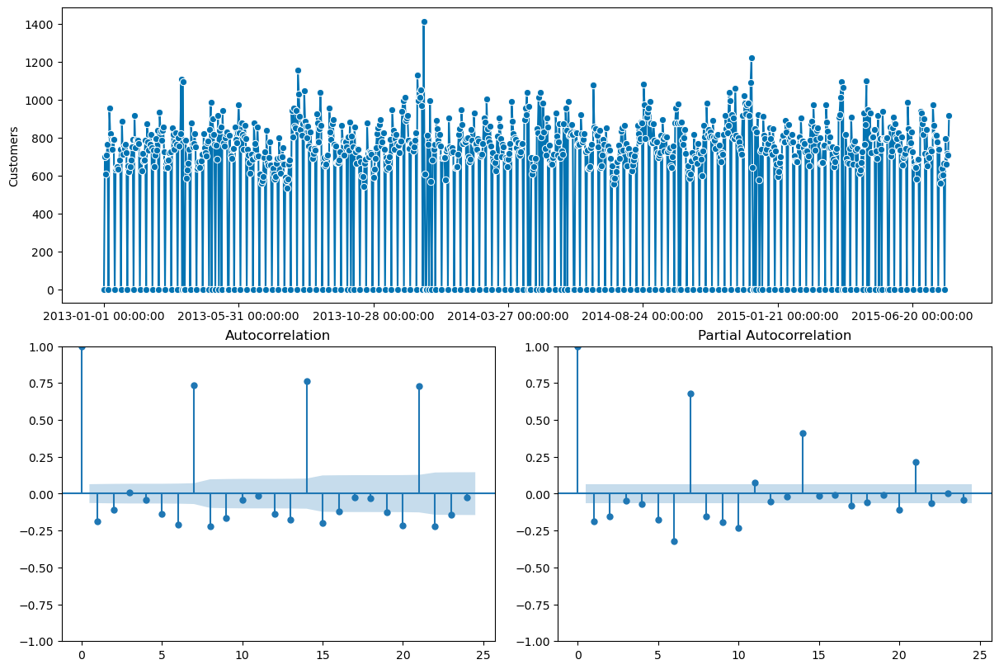

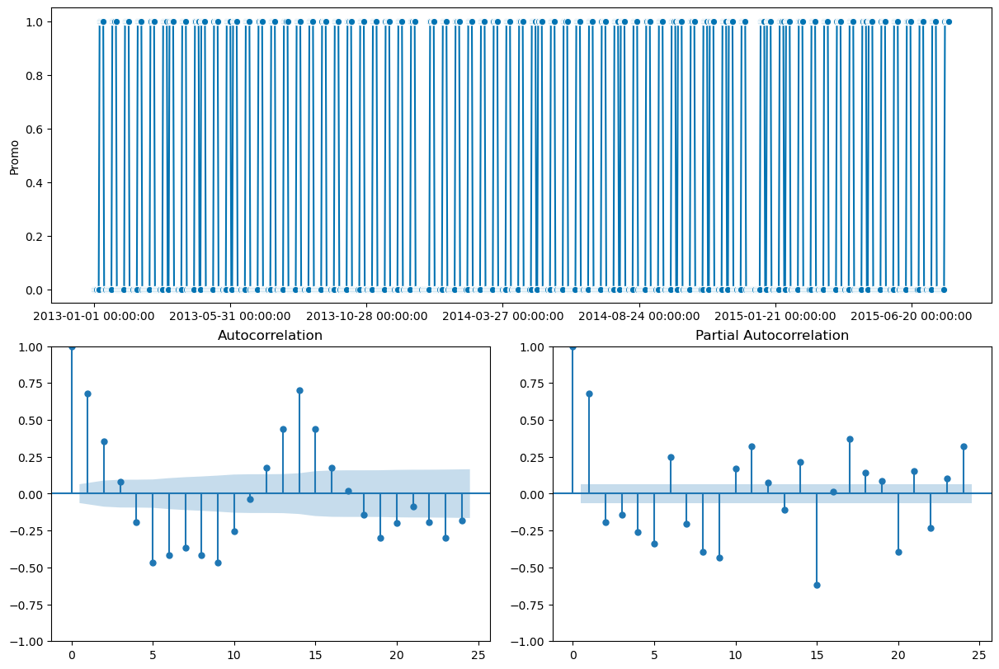

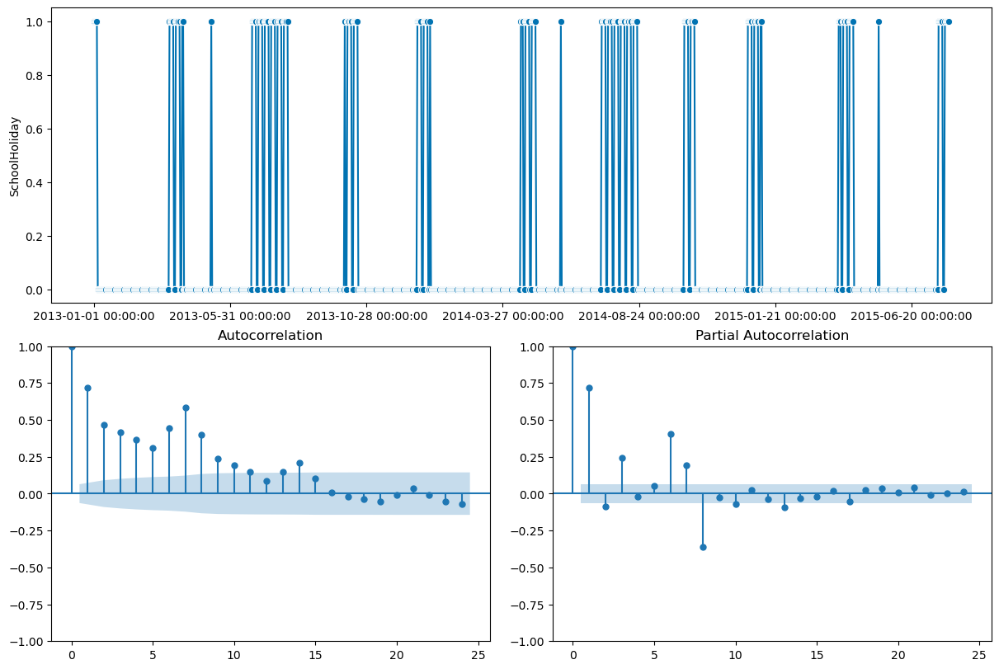

In [12]:
# Graphing while there are 0 values for closed days for T1a
plt.figure(figsize=(15,5))
plot_correlations(df_T1a["Sales"],)
plot_correlations(df_T1a["Customers"],)
plot_correlations(df_T1a["Promo"],)
plot_correlations(df_T1a["SchoolHoliday"],)

### Tienda 1b

(<Figure size 1200x800 with 3 Axes>,
 array([<AxesSubplot:ylabel='SchoolHoliday'>,
        <AxesSubplot:title={'center':'Autocorrelation'}>,
        <AxesSubplot:title={'center':'Partial Autocorrelation'}>],
       dtype=object))

<Figure size 1500x500 with 0 Axes>

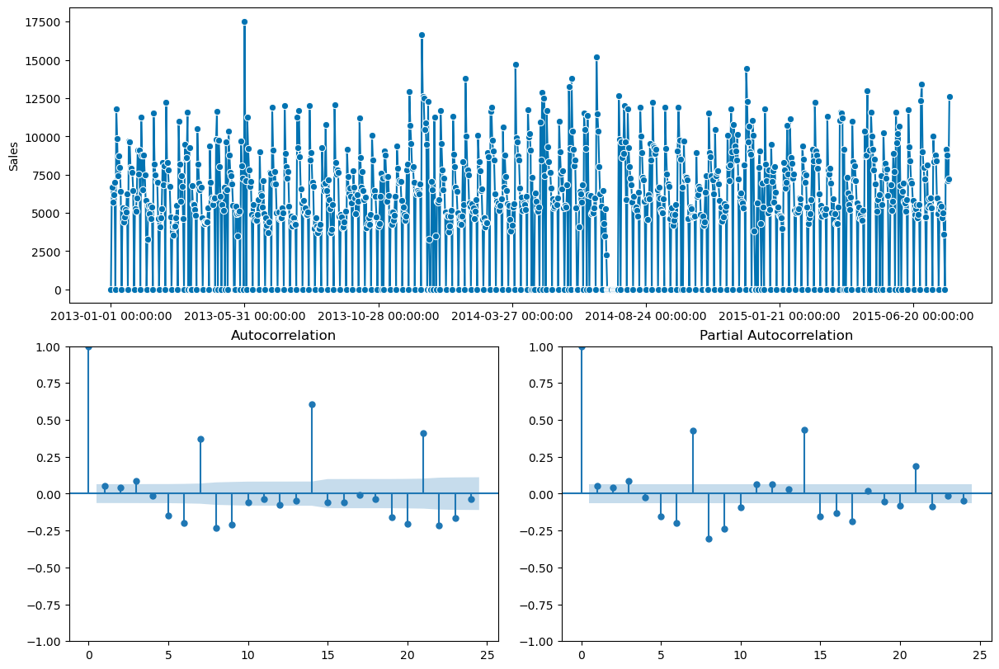

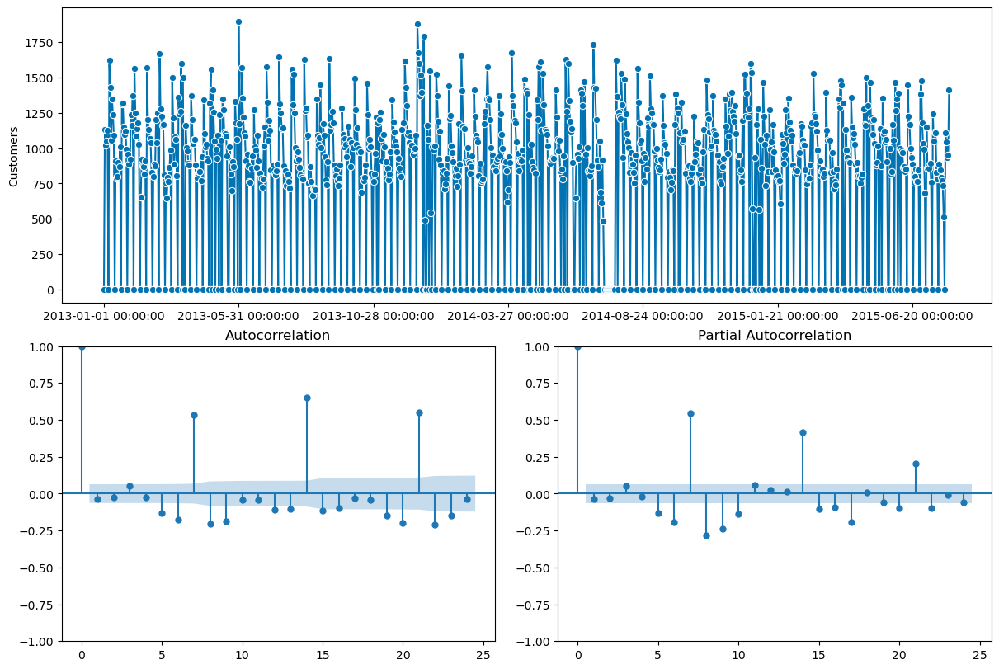

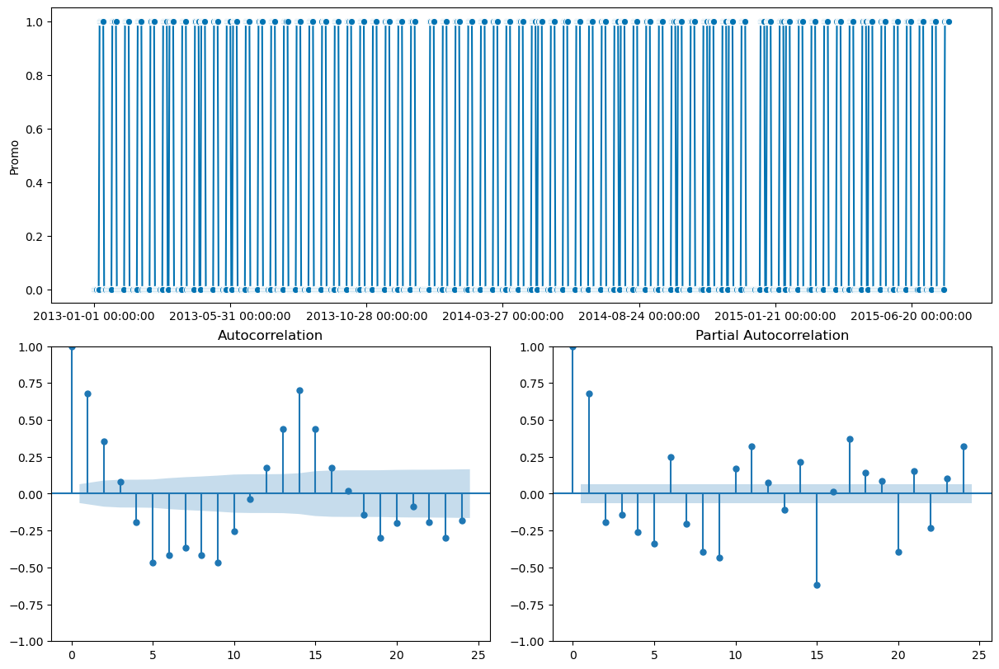

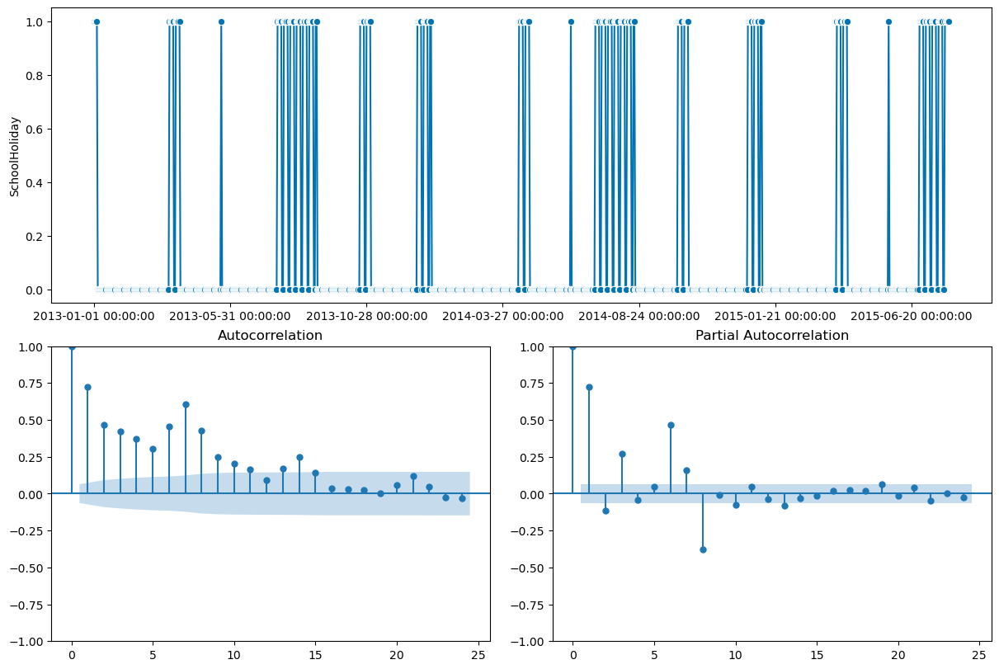

In [13]:
# Graphing while there are 0 values for closed days for T1b
plt.figure(figsize=(15,5))
plot_correlations(df_T1b["Sales"],)
plot_correlations(df_T1b["Customers"],)
plot_correlations(df_T1b["Promo"],)
plot_correlations(df_T1b["SchoolHoliday"],)

'Promo' puede ser un variable importante. Las ventas en general suben cuando hay una promocion. Podemos mirar a data si diás con promoción si tiene alguna compartamiento seasonal. Algunos empresas tienen promocionales estacionales. 

### Tienda 1c

Según aparece que esta tienda no estaba abierta cuando empezamos.

(<Figure size 1200x800 with 3 Axes>,
 array([<AxesSubplot:ylabel='SchoolHoliday'>,
        <AxesSubplot:title={'center':'Autocorrelation'}>,
        <AxesSubplot:title={'center':'Partial Autocorrelation'}>],
       dtype=object))

<Figure size 1500x500 with 0 Axes>

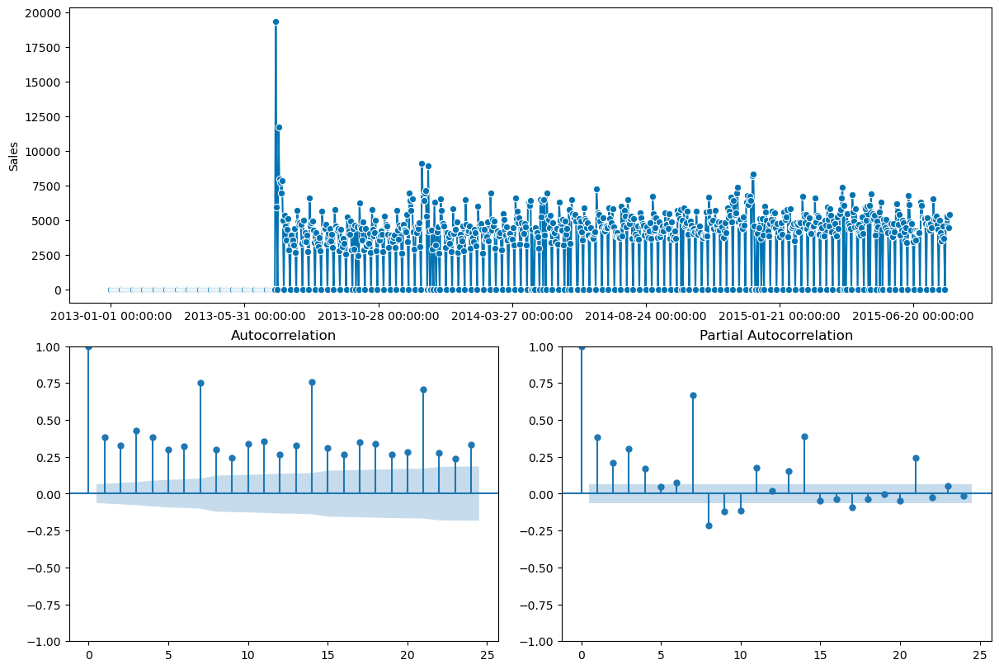

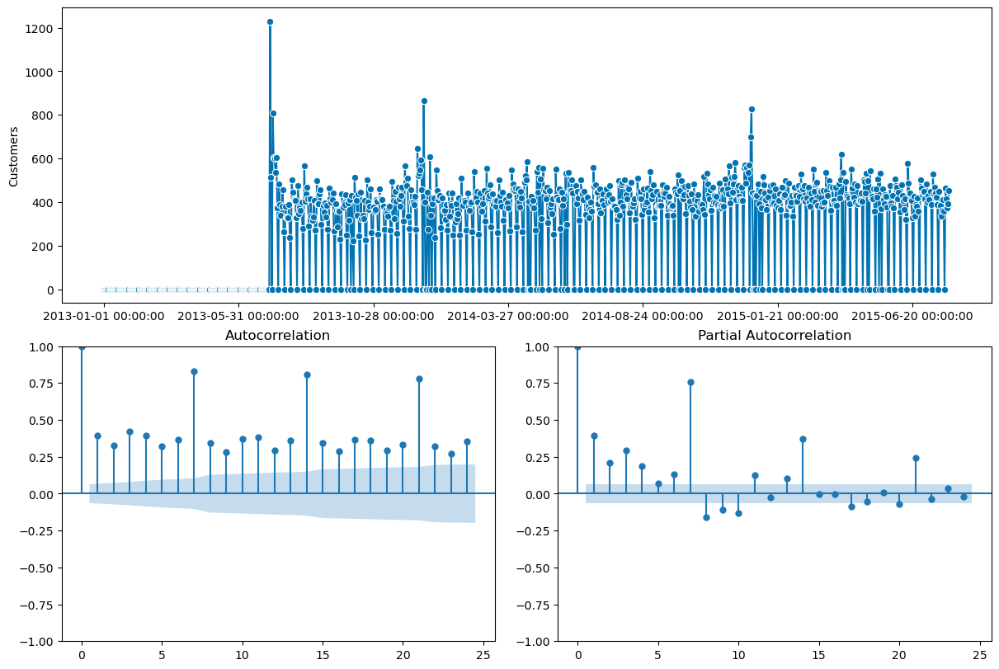

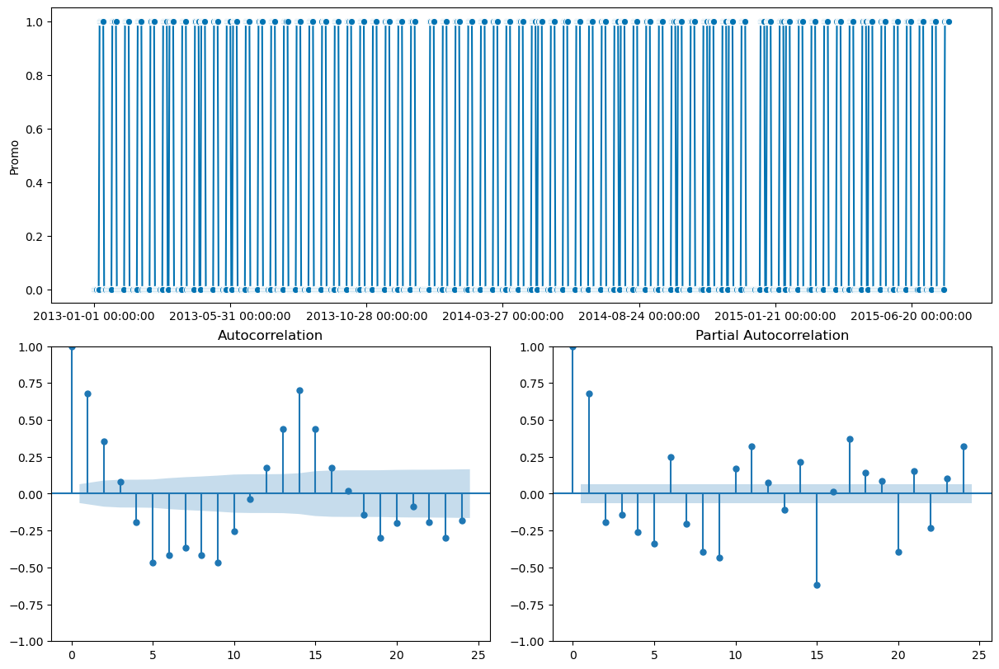

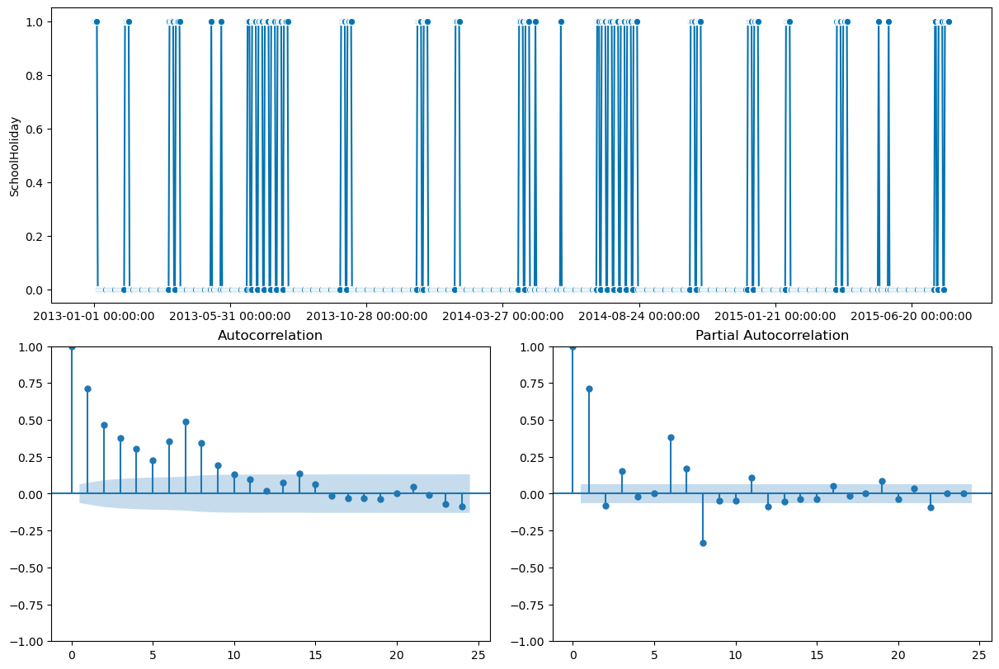

In [14]:
# Graphing while there are 0 values for closed days for T1c
plt.figure(figsize=(15,5))
plot_correlations(df_T1c["Sales"],)
plot_correlations(df_T1c["Customers"],)
plot_correlations(df_T1c["Promo"],)
plot_correlations(df_T1c["SchoolHoliday"],)

### Tienda 2a

(<Figure size 1200x800 with 3 Axes>,
 array([<AxesSubplot:ylabel='SchoolHoliday'>,
        <AxesSubplot:title={'center':'Autocorrelation'}>,
        <AxesSubplot:title={'center':'Partial Autocorrelation'}>],
       dtype=object))

<Figure size 1500x500 with 0 Axes>

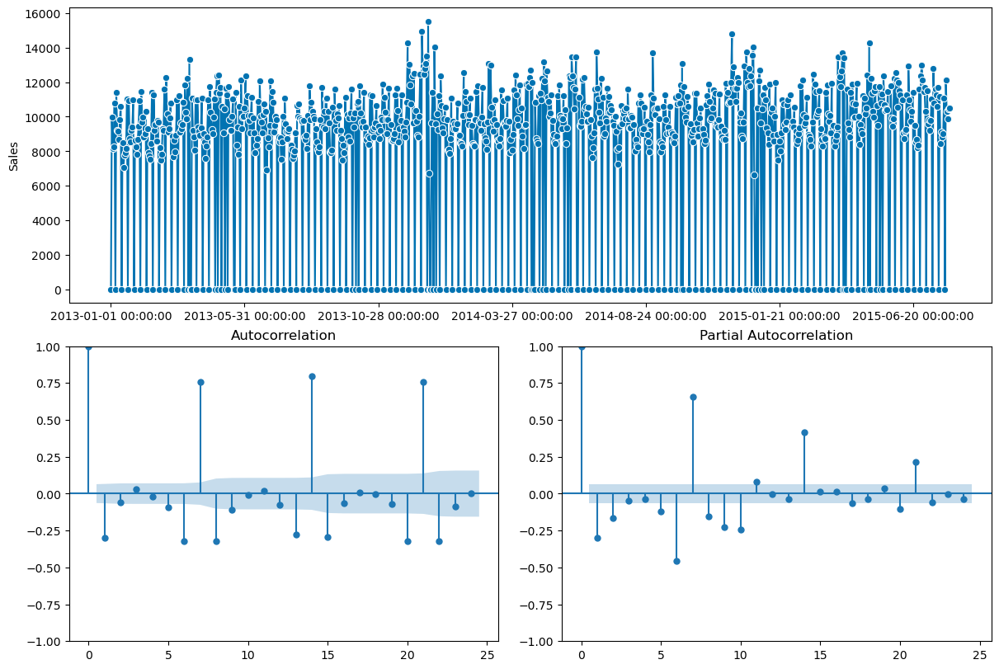

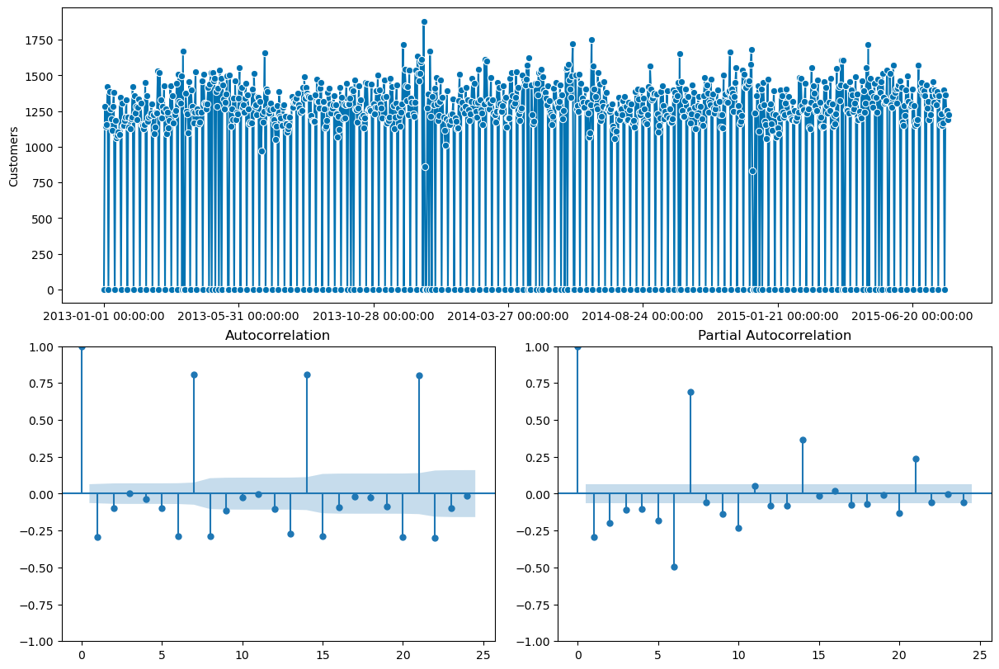

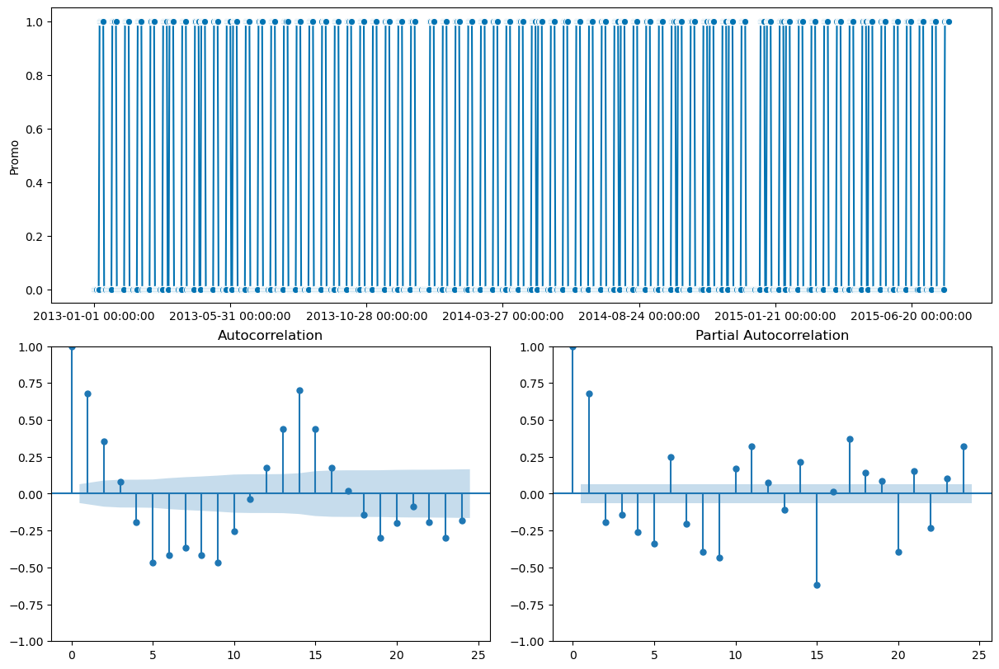

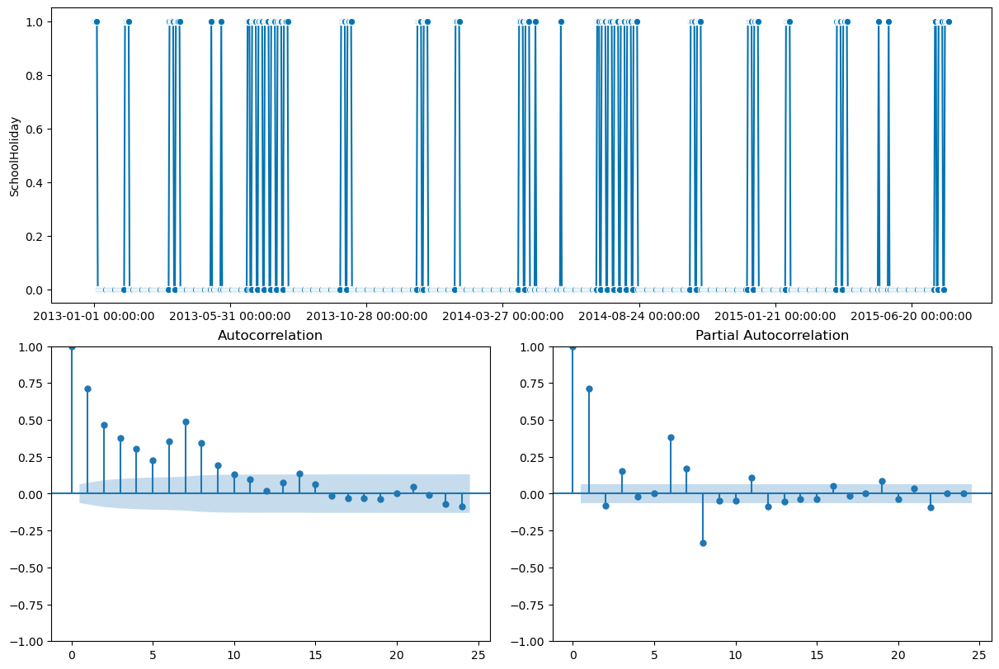

In [15]:
# Graphing while there are 0 values for closed days for T2a
plt.figure(figsize=(15,5))
plot_correlations(df_T2a["Sales"],)
plot_correlations(df_T2a["Customers"],)
plot_correlations(df_T2a["Promo"],)
plot_correlations(df_T2a["SchoolHoliday"],)

### Tienda 2b

(<Figure size 1200x800 with 3 Axes>,
 array([<AxesSubplot:ylabel='SchoolHoliday'>,
        <AxesSubplot:title={'center':'Autocorrelation'}>,
        <AxesSubplot:title={'center':'Partial Autocorrelation'}>],
       dtype=object))

<Figure size 1500x500 with 0 Axes>

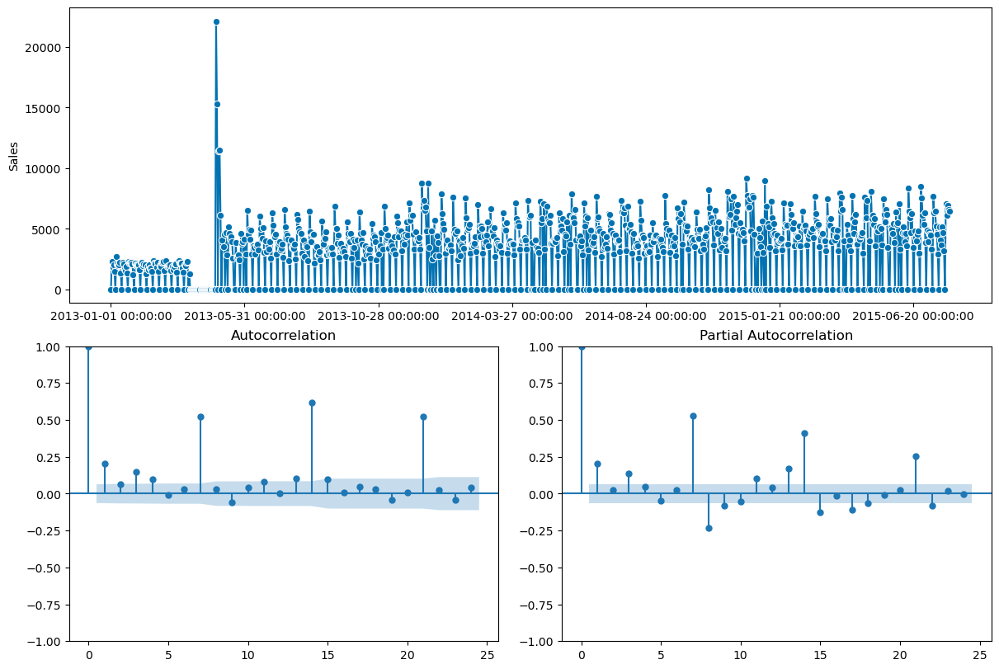

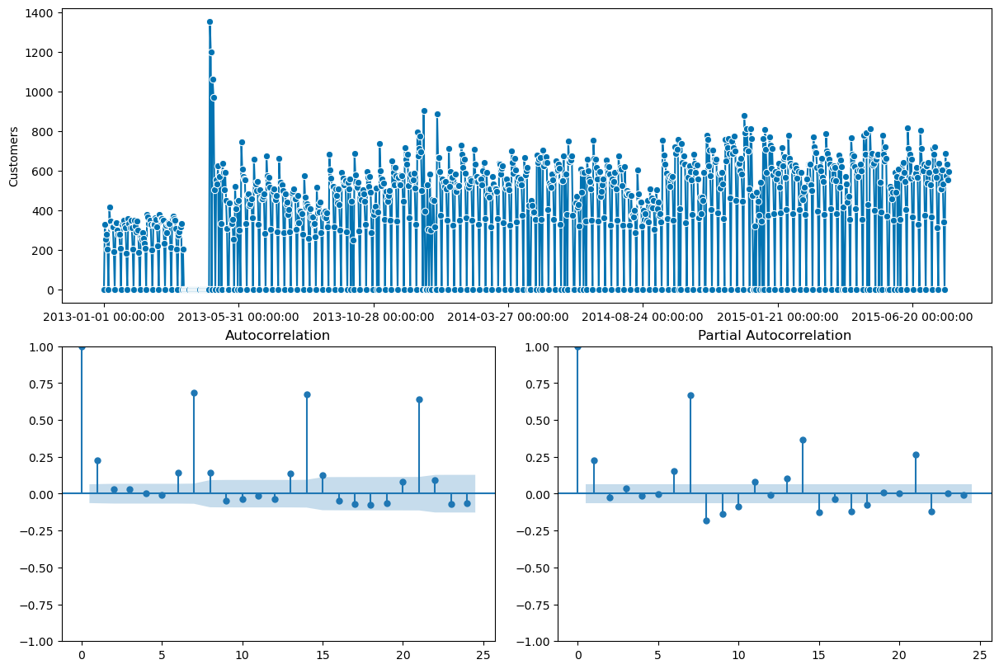

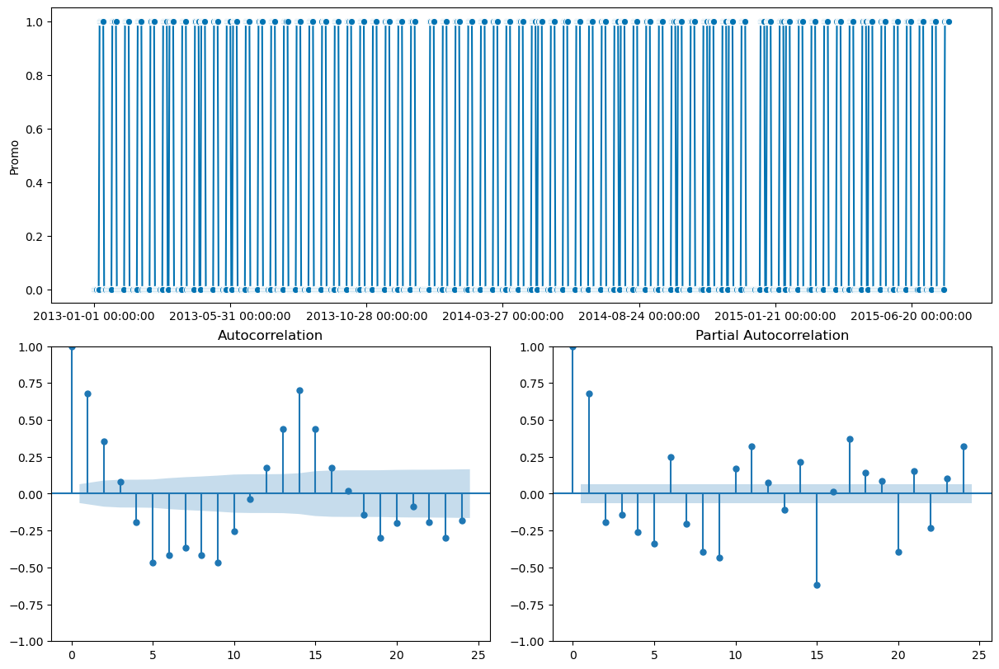

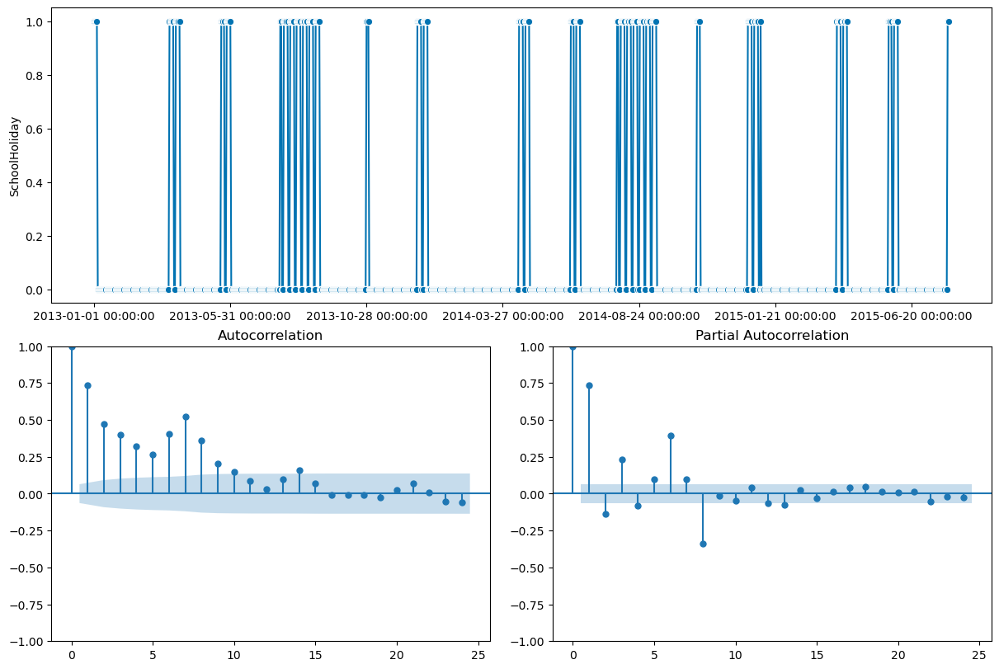

In [16]:
# Graphing while there are 0 values for closed days for T2b
plt.figure(figsize=(15,5))
plot_correlations(df_T2b["Sales"],)
plot_correlations(df_T2b["Customers"],)
plot_correlations(df_T2b["Promo"],)
plot_correlations(df_T2b["SchoolHoliday"],)

### Tienda 2c

(<Figure size 1200x800 with 3 Axes>,
 array([<AxesSubplot:ylabel='SchoolHoliday'>,
        <AxesSubplot:title={'center':'Autocorrelation'}>,
        <AxesSubplot:title={'center':'Partial Autocorrelation'}>],
       dtype=object))

<Figure size 1500x500 with 0 Axes>

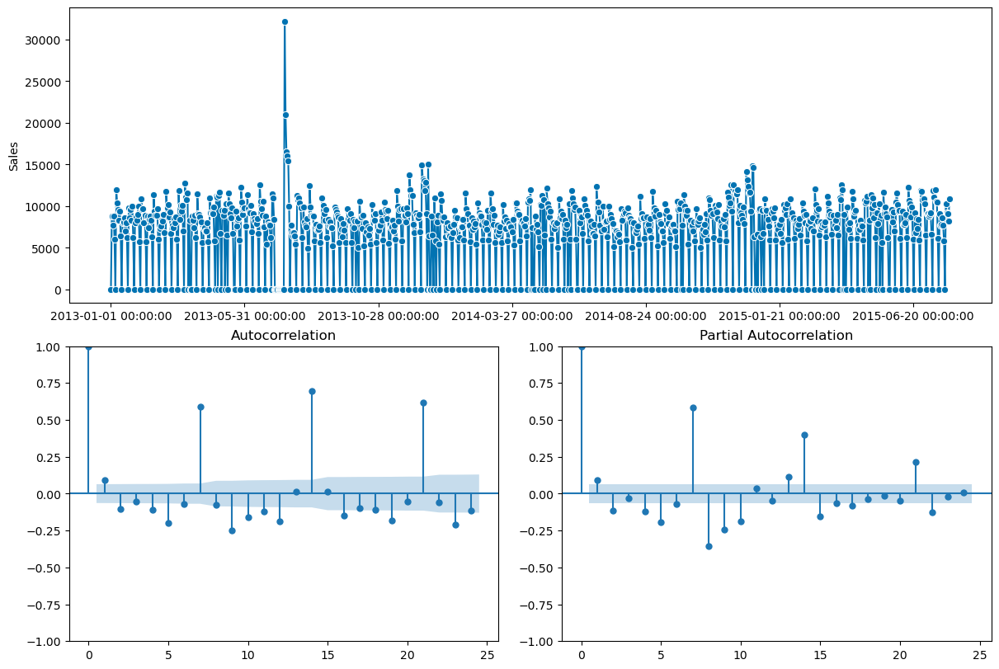

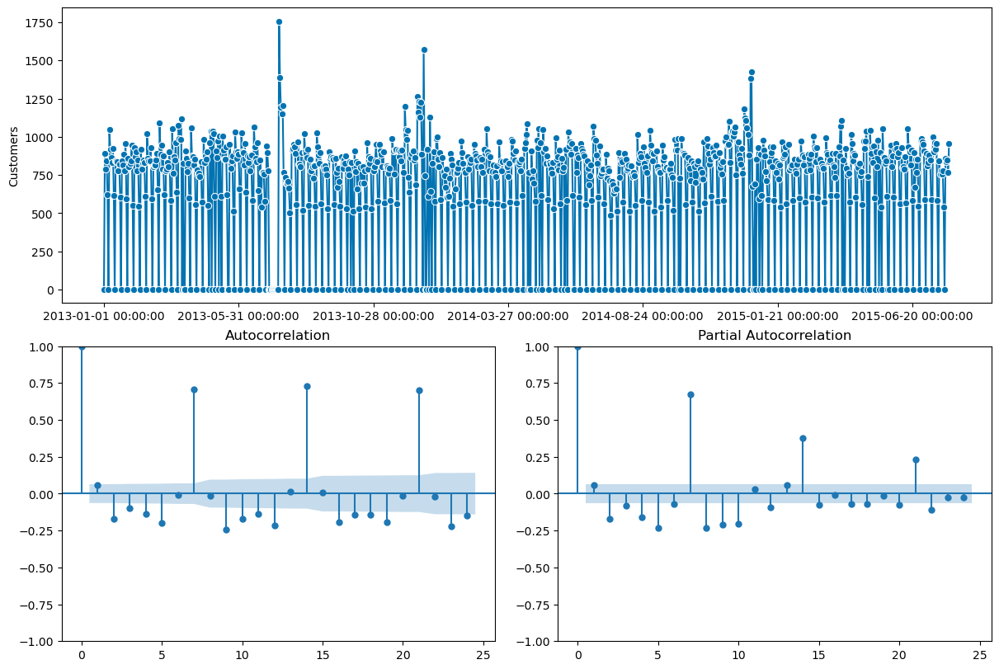

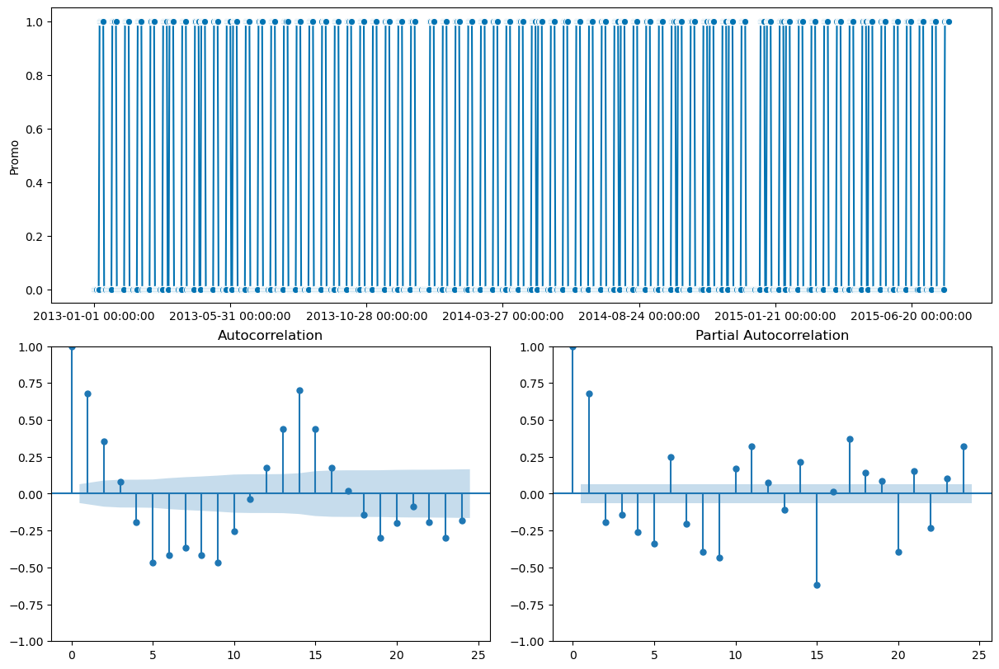

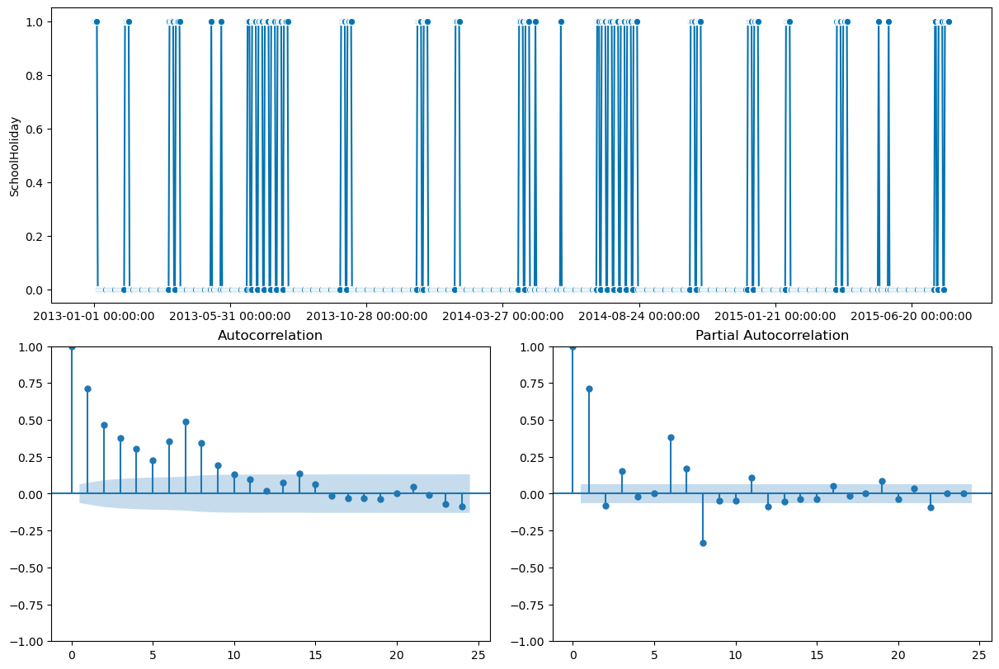

In [17]:
# Graphing while there are 0 values for closed days for T2c
plt.figure(figsize=(15,5))
plot_correlations(df_T2c["Sales"],)
plot_correlations(df_T2c["Customers"],)
plot_correlations(df_T2c["Promo"],)
plot_correlations(df_T2c["SchoolHoliday"],)

### Tienda 3a

(<Figure size 1200x800 with 3 Axes>,
 array([<AxesSubplot:ylabel='SchoolHoliday'>,
        <AxesSubplot:title={'center':'Autocorrelation'}>,
        <AxesSubplot:title={'center':'Partial Autocorrelation'}>],
       dtype=object))

<Figure size 1500x500 with 0 Axes>

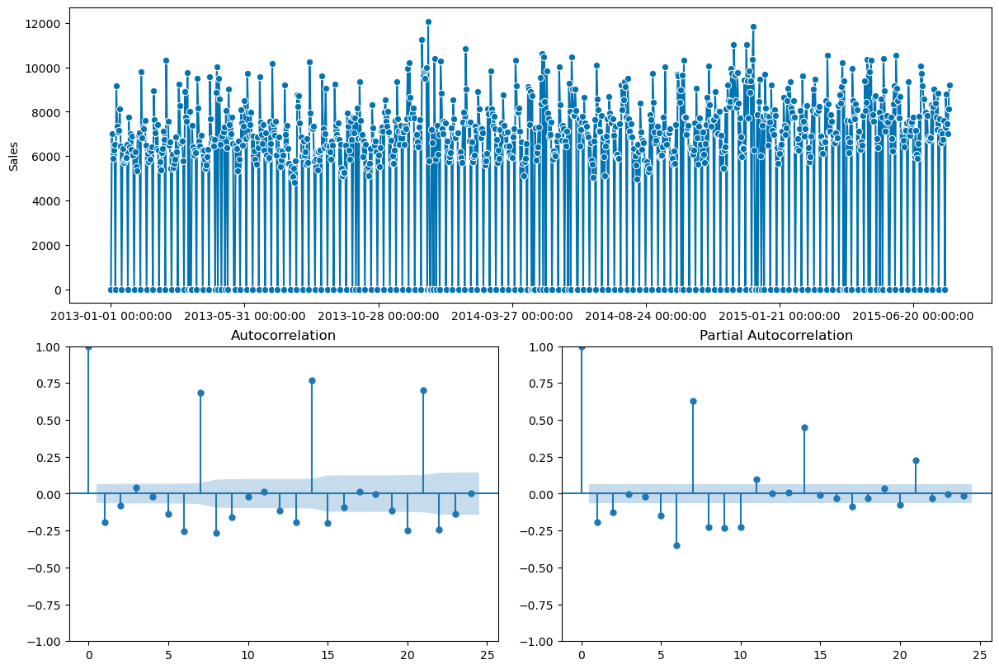

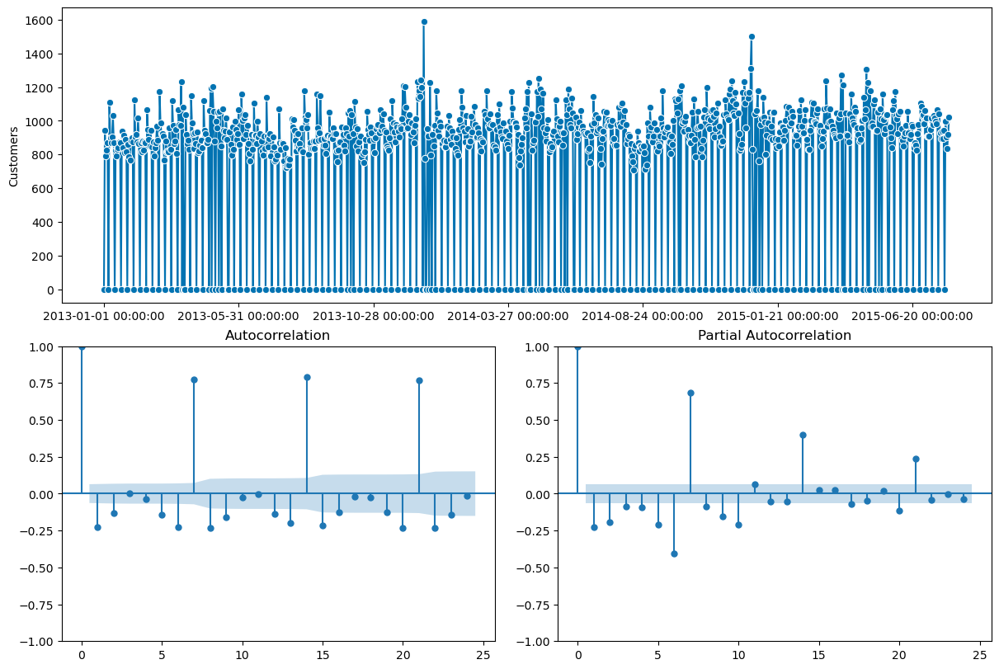

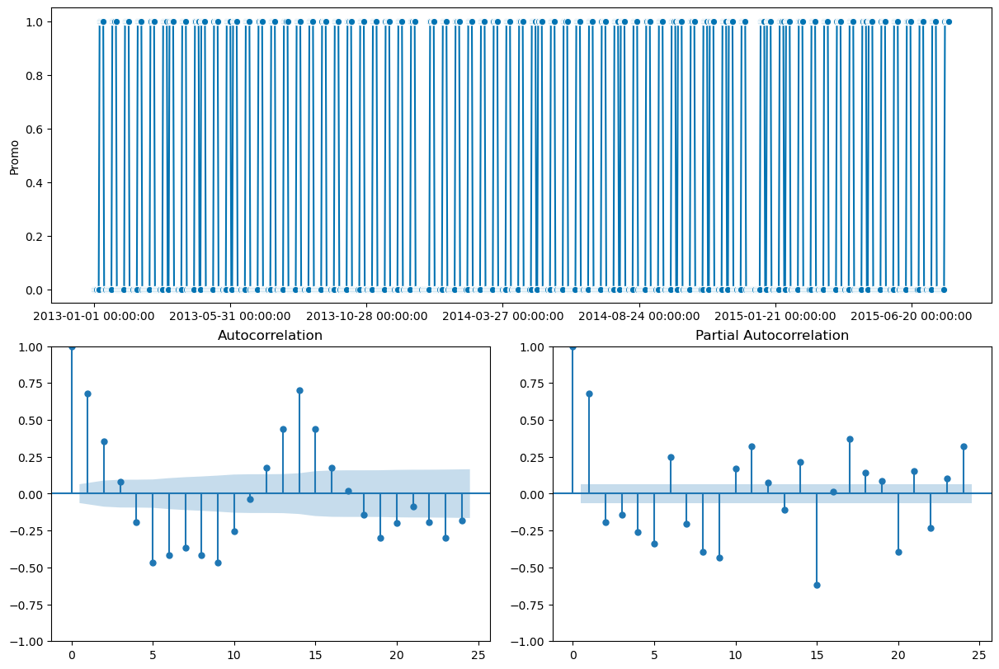

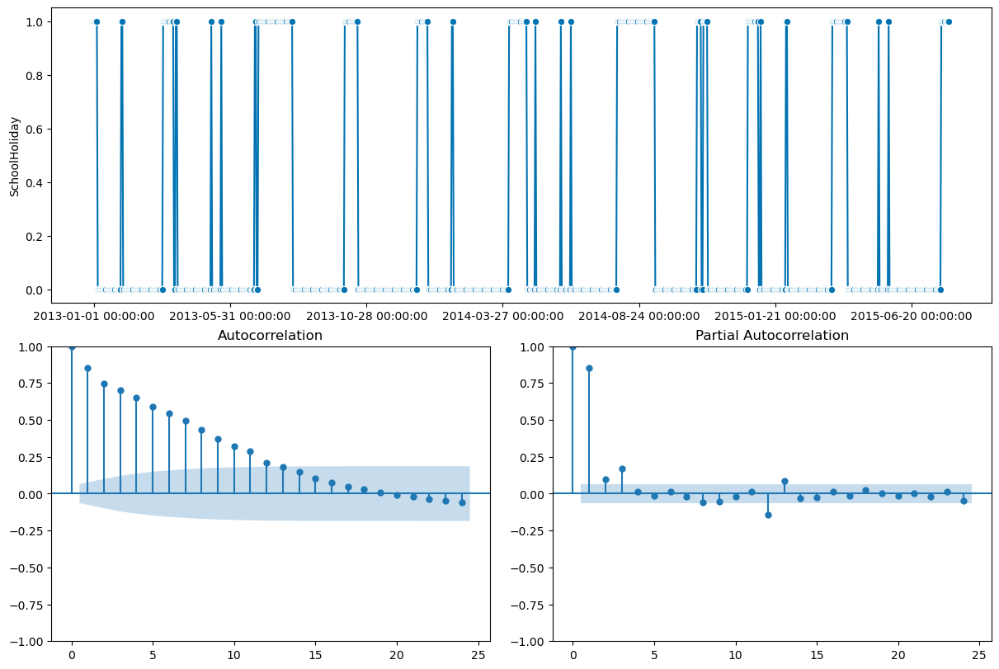

In [18]:
# Graphing while there are 0 values for closed days for T3a
plt.figure(figsize=(15,5))
plot_correlations(df_T3a["Sales"],)
plot_correlations(df_T3a["Customers"],)
plot_correlations(df_T3a["Promo"],)
plot_correlations(df_T3a["SchoolHoliday"],)

### Tienda 3b

(<Figure size 1200x800 with 3 Axes>,
 array([<AxesSubplot:ylabel='SchoolHoliday'>,
        <AxesSubplot:title={'center':'Autocorrelation'}>,
        <AxesSubplot:title={'center':'Partial Autocorrelation'}>],
       dtype=object))

<Figure size 1500x500 with 0 Axes>

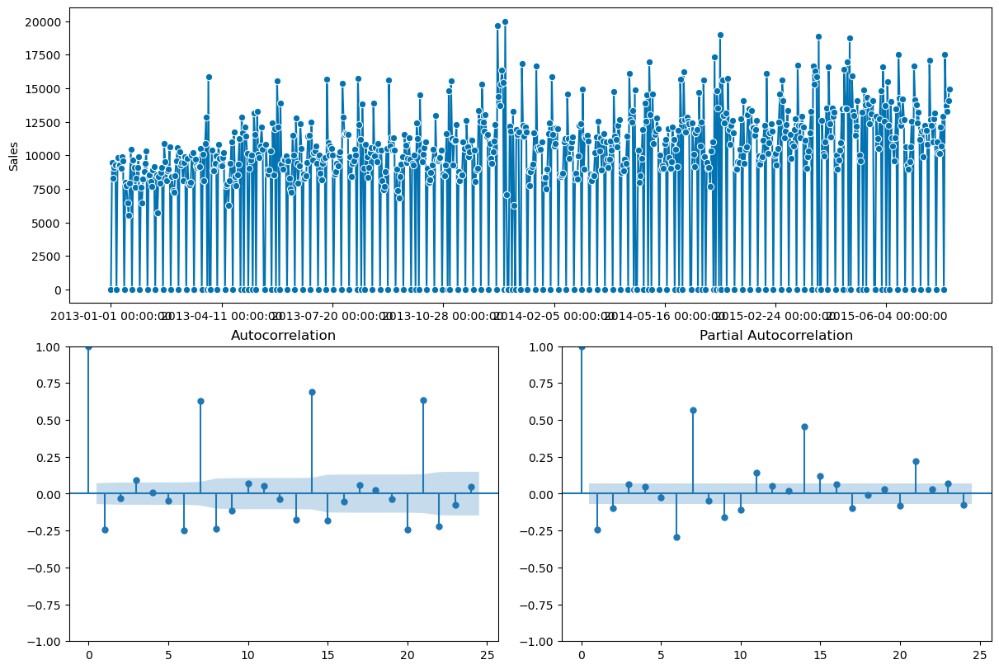

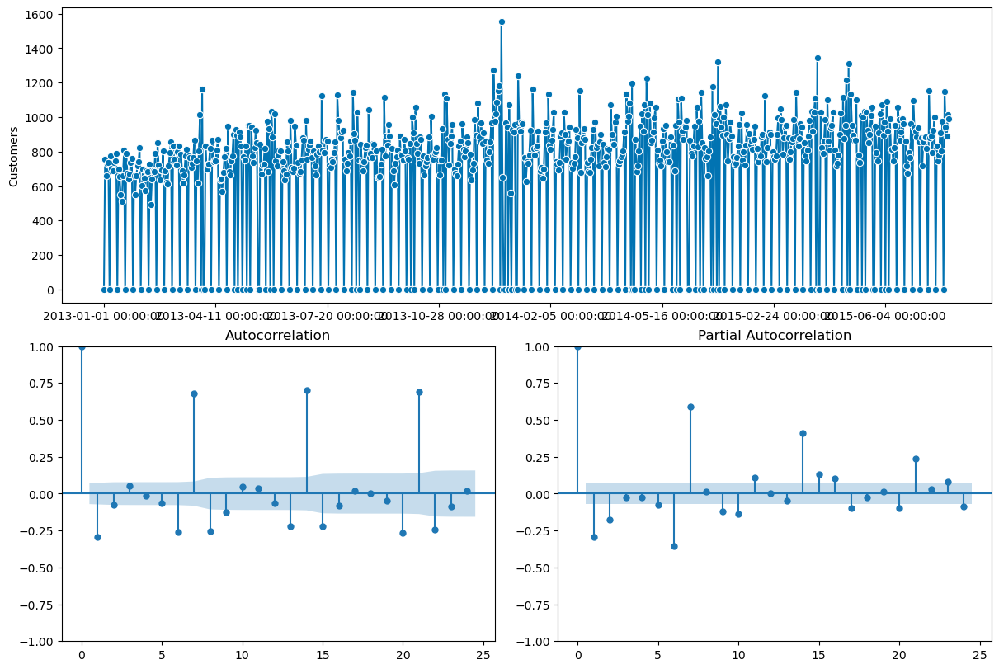

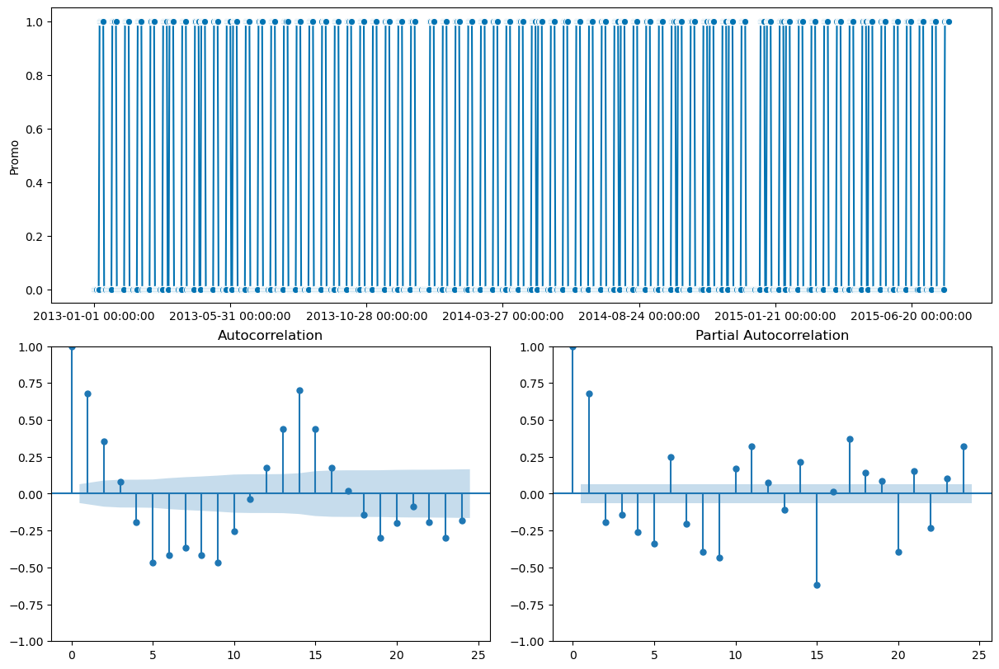

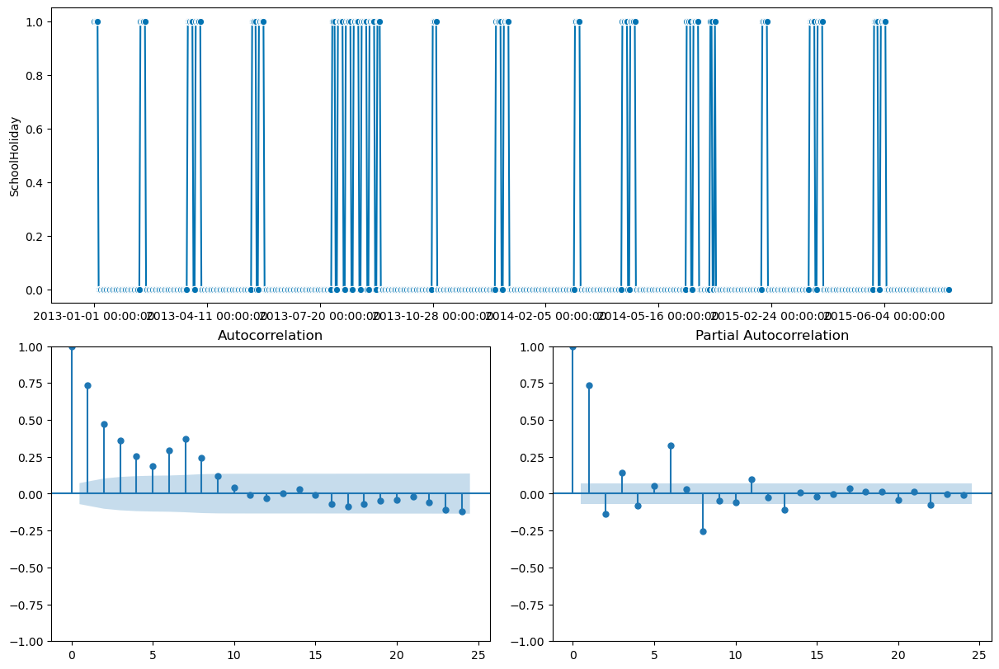

In [19]:
# Graphing while there are 0 values for closed days for T3b
plt.figure(figsize=(15,5))
plot_correlations(df_T3b["Sales"],)
plot_correlations(df_T3b["Customers"],)
plot_correlations(df_T3c["Promo"],)
plot_correlations(df_T3b["SchoolHoliday"],)

### Tienda 3c

(<Figure size 1200x800 with 3 Axes>,
 array([<AxesSubplot:ylabel='SchoolHoliday'>,
        <AxesSubplot:title={'center':'Autocorrelation'}>,
        <AxesSubplot:title={'center':'Partial Autocorrelation'}>],
       dtype=object))

<Figure size 1500x500 with 0 Axes>

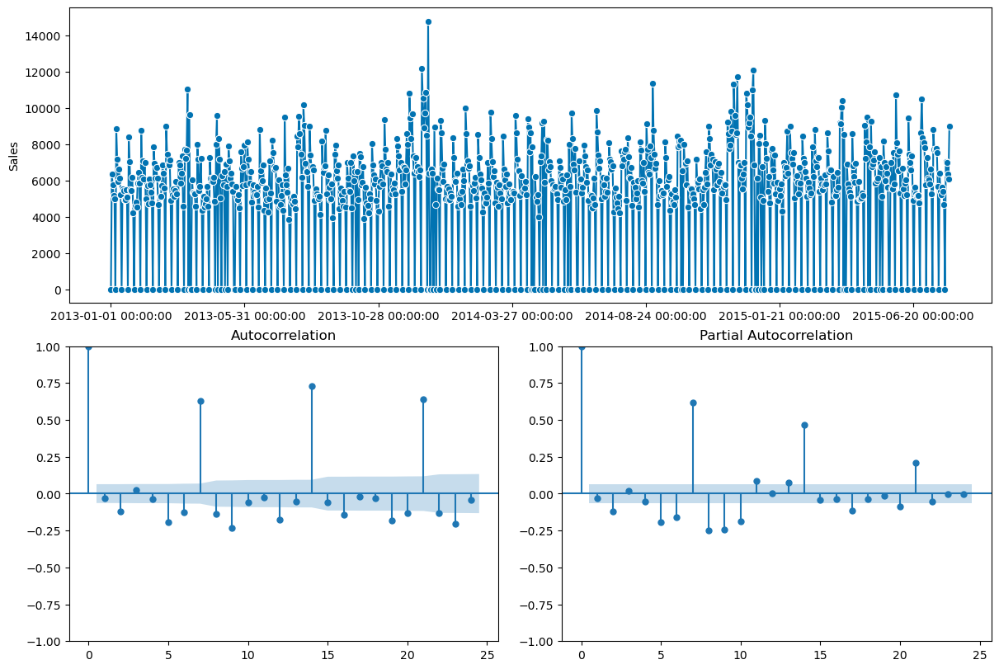

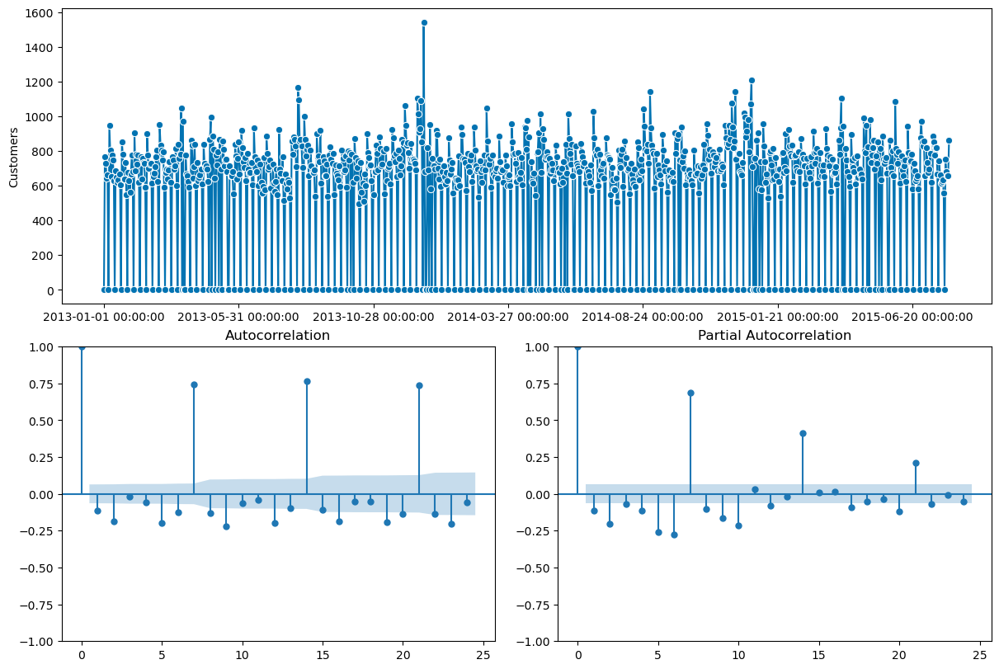

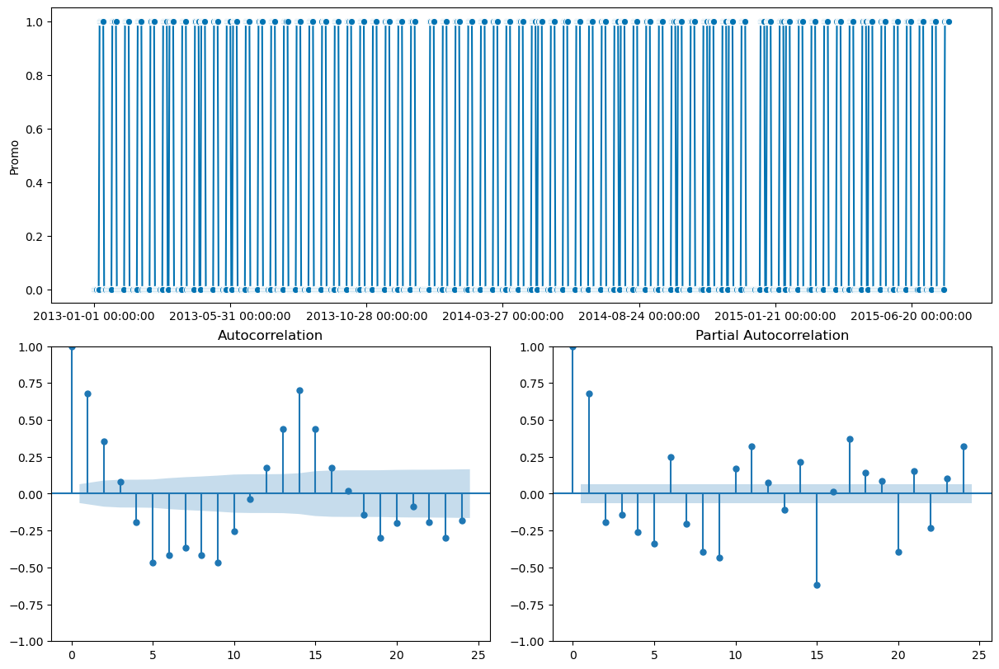

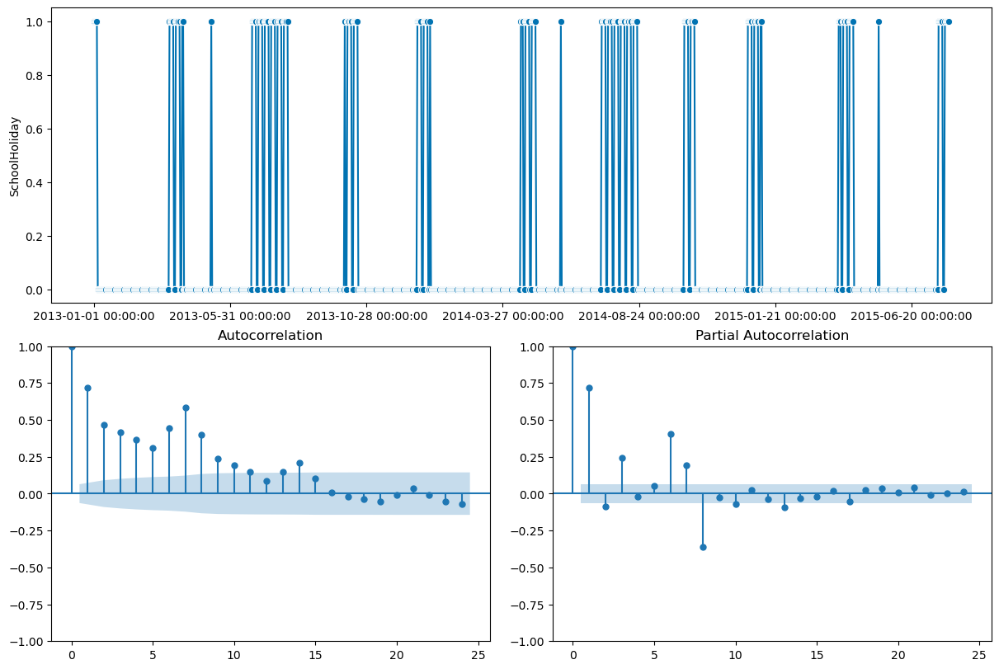

In [20]:
# Graphing while there are 0 values for closed days for T3c
plt.figure(figsize=(15,5))
plot_correlations(df_T3c["Sales"],)
plot_correlations(df_T3c["Customers"],)
plot_correlations(df_T3c["Promo"],)
plot_correlations(df_T3c["SchoolHoliday"],)

### Tienda 3d

(<Figure size 1200x800 with 3 Axes>,
 array([<AxesSubplot:ylabel='SchoolHoliday'>,
        <AxesSubplot:title={'center':'Autocorrelation'}>,
        <AxesSubplot:title={'center':'Partial Autocorrelation'}>],
       dtype=object))

<Figure size 1500x500 with 0 Axes>

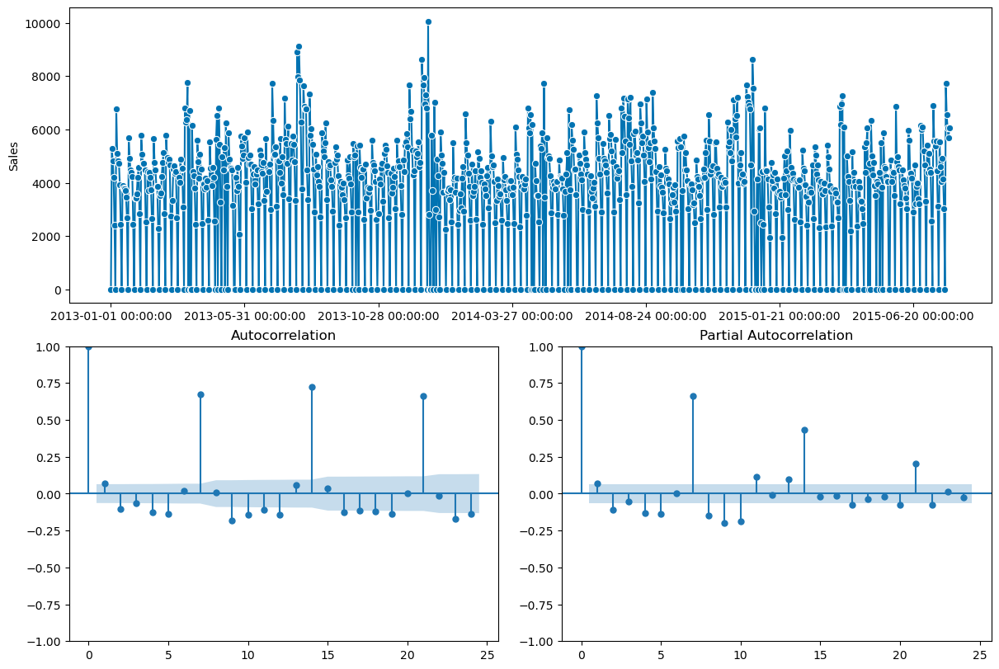

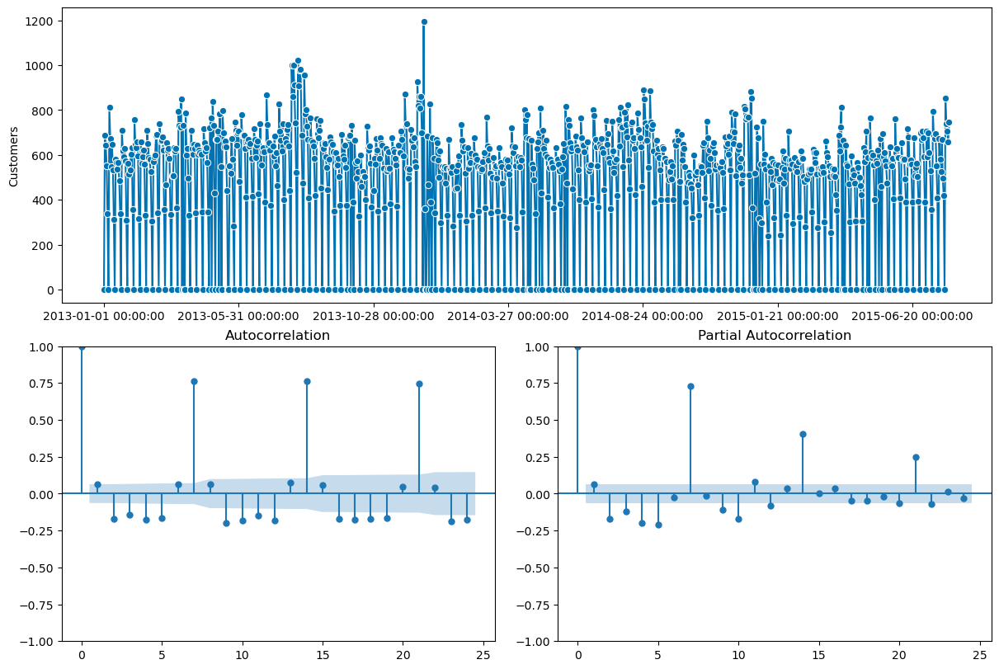

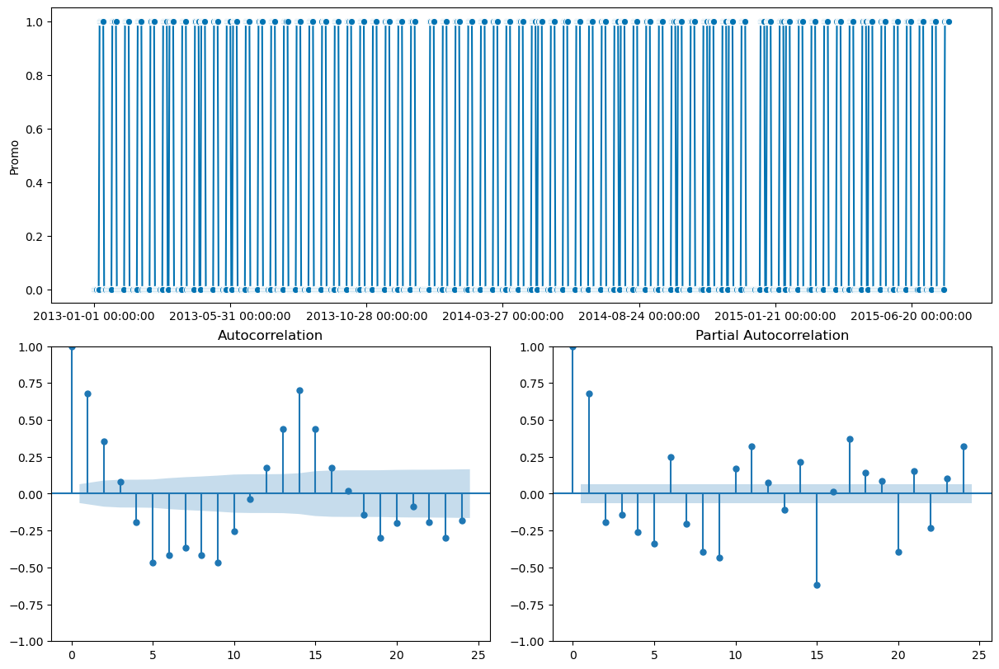

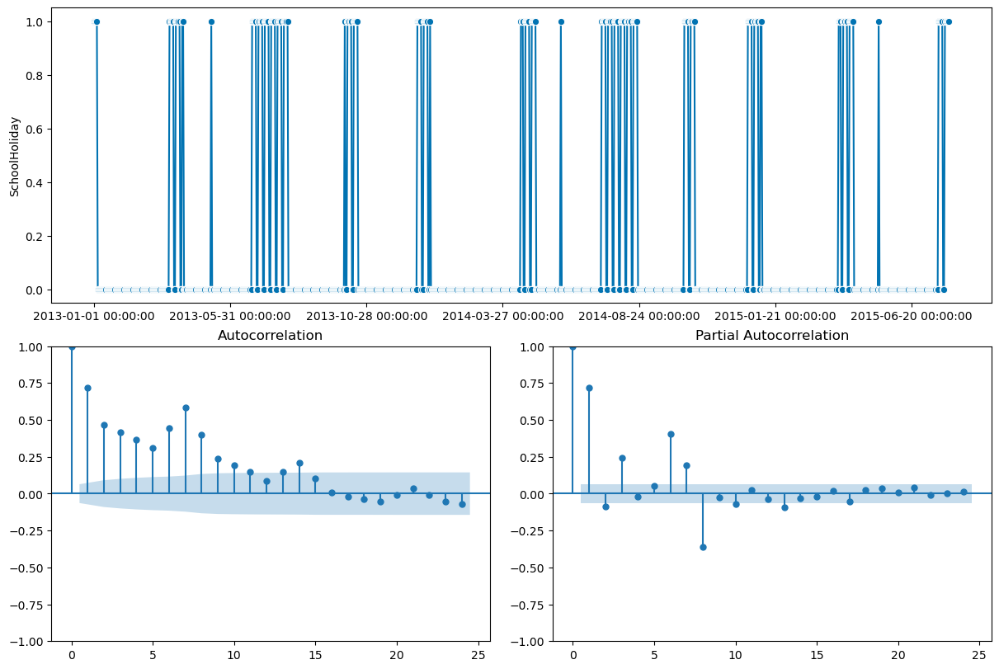

In [21]:
# Graphing while there are 0 values for closed days for T3d
plt.figure(figsize=(15,5))
plot_correlations(df_T3d["Sales"],)
plot_correlations(df_T3d["Customers"],)
plot_correlations(df_T3d["Promo"],)
plot_correlations(df_T3d["SchoolHoliday"],)


## 2. Graficar ventas diarias en 3 zonas

Para hacer graficas diaris en 3 zonas, tenemos que sumar datos para zonas. Cuando hacemos este suma tambien nos suma otros datos tambien (vacaciones, y disponibilidad de tienda). Ahora por ejemplo, variable 'Open' representa cantidad de tiendas en la zona. En misma zona las vacaciones son similares y ahora representamos numericamente, solamente en 3 en vez de 1.

In [73]:
data['Zone'] = data['Store'].str[:2]

df_total1

,Store,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,Zone
Date,,,,,,,,,
2013-01-01,T1c,2,0,0,0,0,1,1,T1
2013-01-01,T1b,2,0,0,0,0,1,1,T1
2013-01-01,T1a,2,0,0,0,0,1,1,T1
2013-01-02,T1a,3,6072,697,1,0,0,1,T1
2013-01-02,T1c,3,0,0,0,0,0,1,T1
...,...,...,...,...,...,...,...,...,...
2015-07-30,T1b,4,7241,949,1,1,0,1,T1
2015-07-30,T1a,4,8655,709,1,1,0,1,T1
2015-07-31,T1c,5,5425,453,1,1,0,1,T1


In [80]:
df_total1 = data[data['Zone']== 'T1'].sort_index().groupby('Date').sum()
df_total2 = data[data['Zone']== 'T2'].sort_index().groupby('Date').sum()
df_total3 = data[data['Zone']== 'T3'].sort_index().groupby('Date').sum()


###  Zona 1

(<Figure size 1200x800 with 3 Axes>,
 array([<AxesSubplot:ylabel='SchoolHoliday'>,
        <AxesSubplot:title={'center':'Autocorrelation'}>,
        <AxesSubplot:title={'center':'Partial Autocorrelation'}>],
       dtype=object))

<Figure size 1500x500 with 0 Axes>

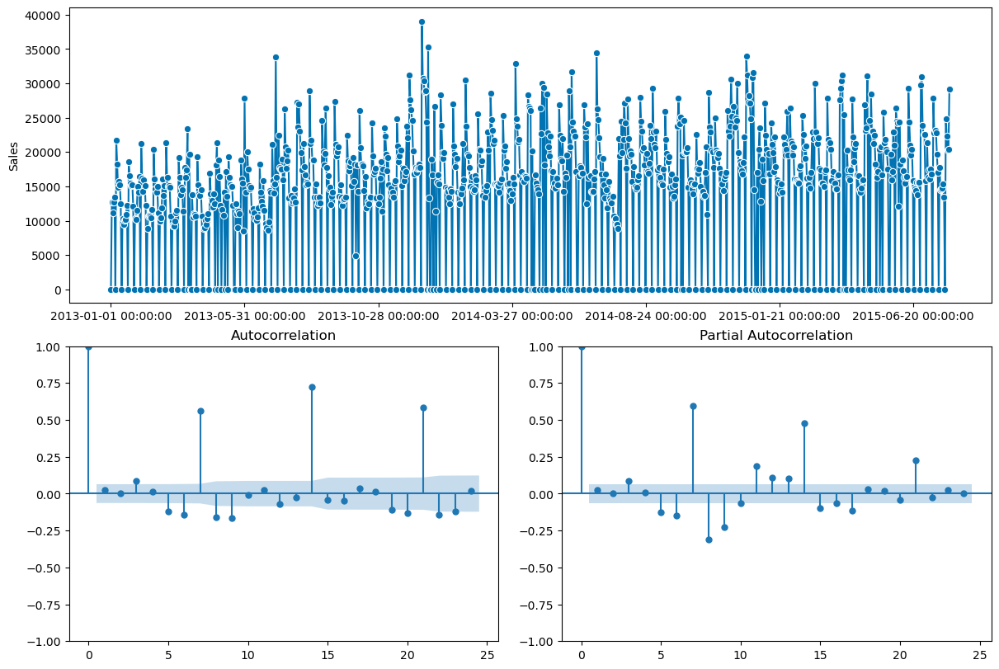

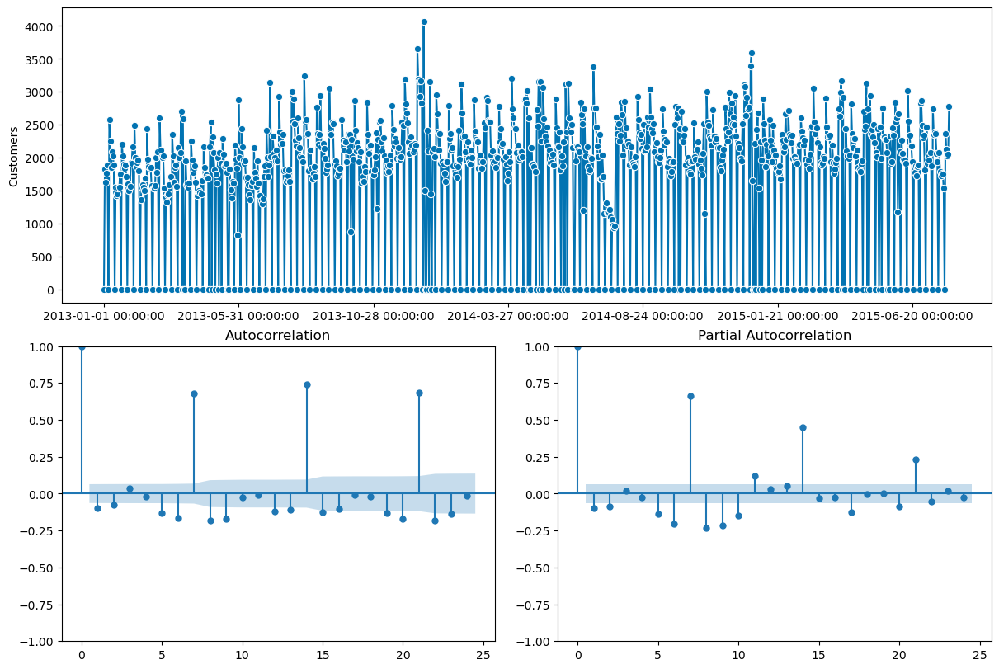

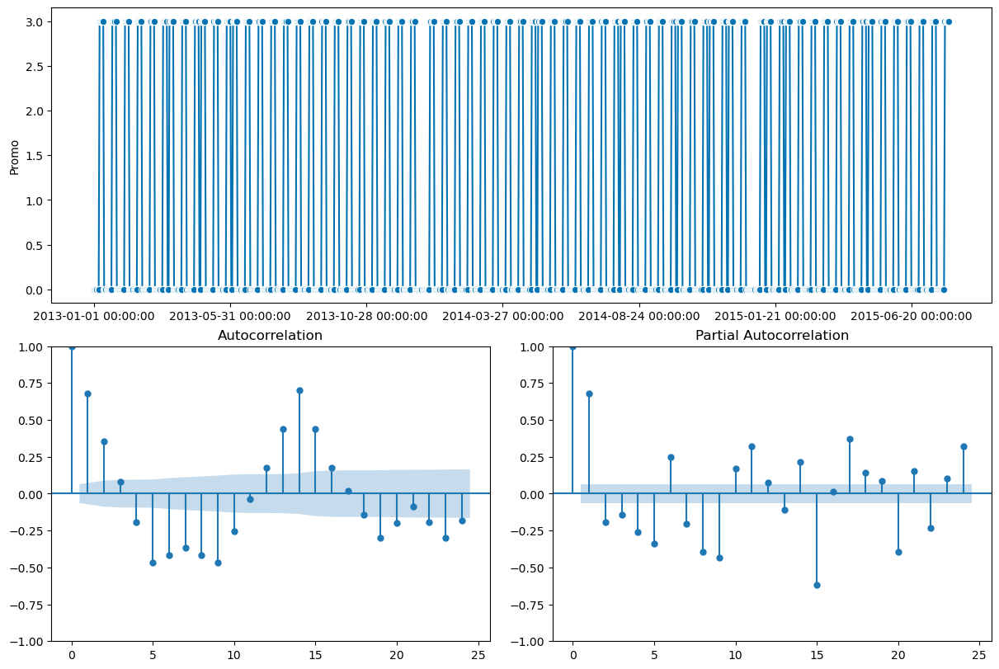

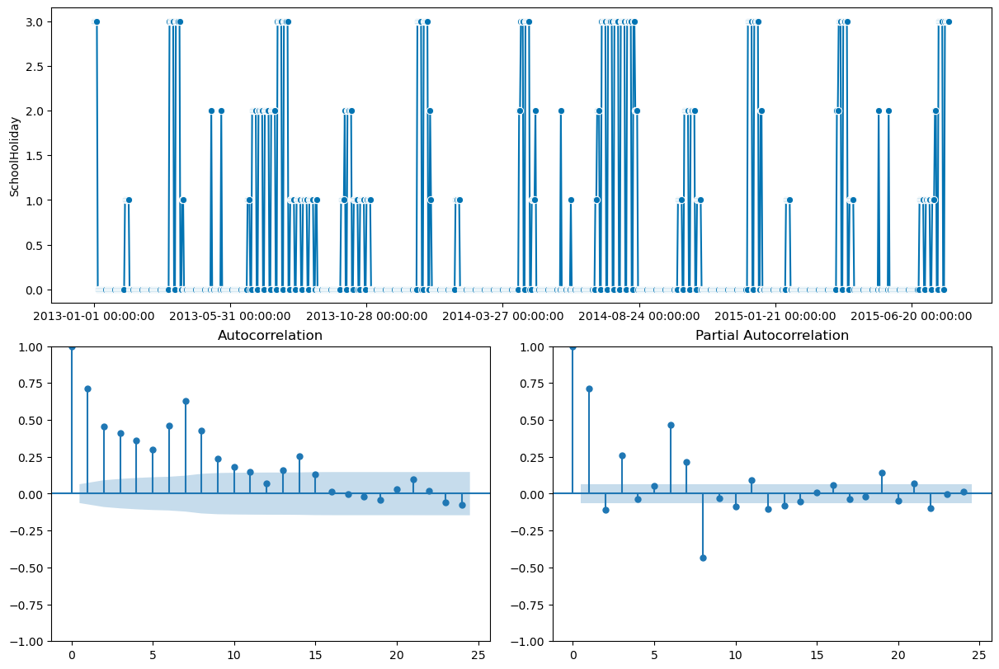

In [82]:
# Graphing while there are 0 values for closed days for 1st region.
plt.figure(figsize=(15,5))
plot_correlations(df_total1["Sales"],)
plot_correlations(df_total1["Customers"],)
plot_correlations(df_total1["Promo"],)
plot_correlations(df_total1["SchoolHoliday"],)

### Zona 2

(<Figure size 1200x800 with 3 Axes>,
 array([<AxesSubplot:ylabel='SchoolHoliday'>,
        <AxesSubplot:title={'center':'Autocorrelation'}>,
        <AxesSubplot:title={'center':'Partial Autocorrelation'}>],
       dtype=object))

<Figure size 1500x500 with 0 Axes>

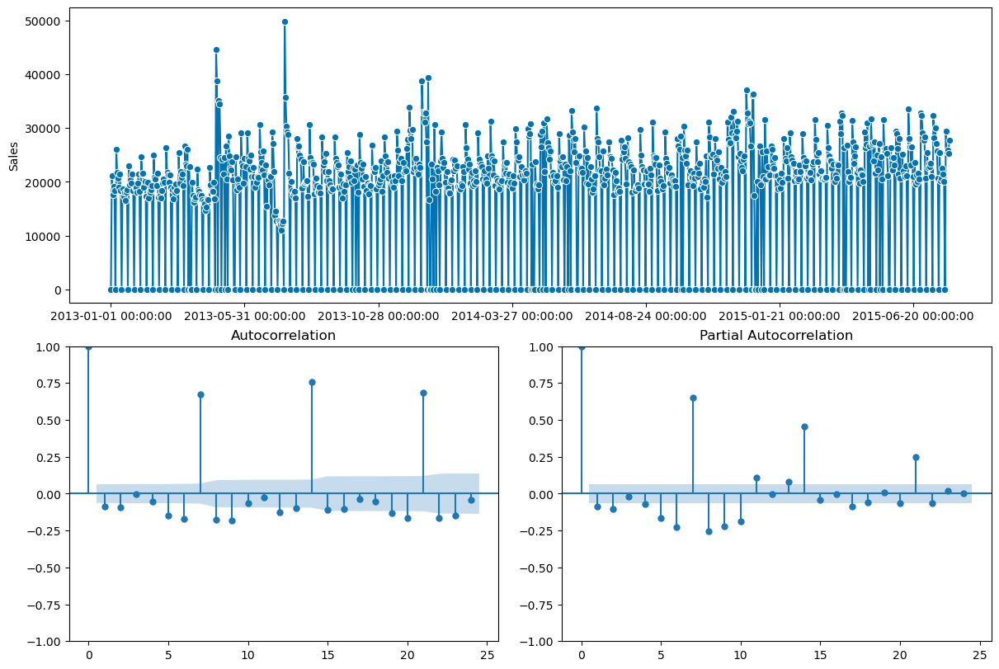

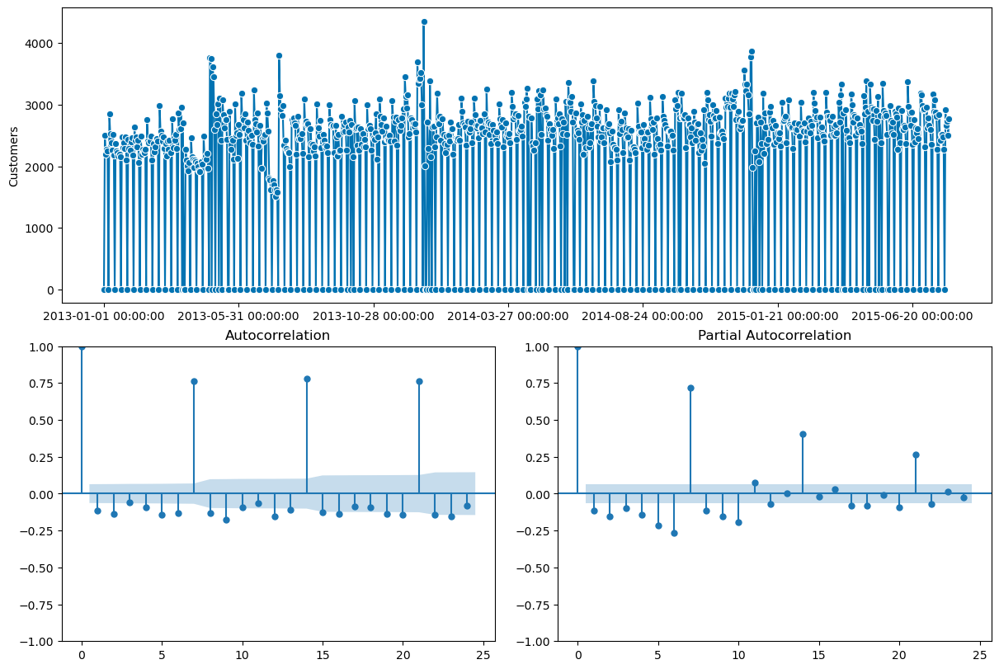

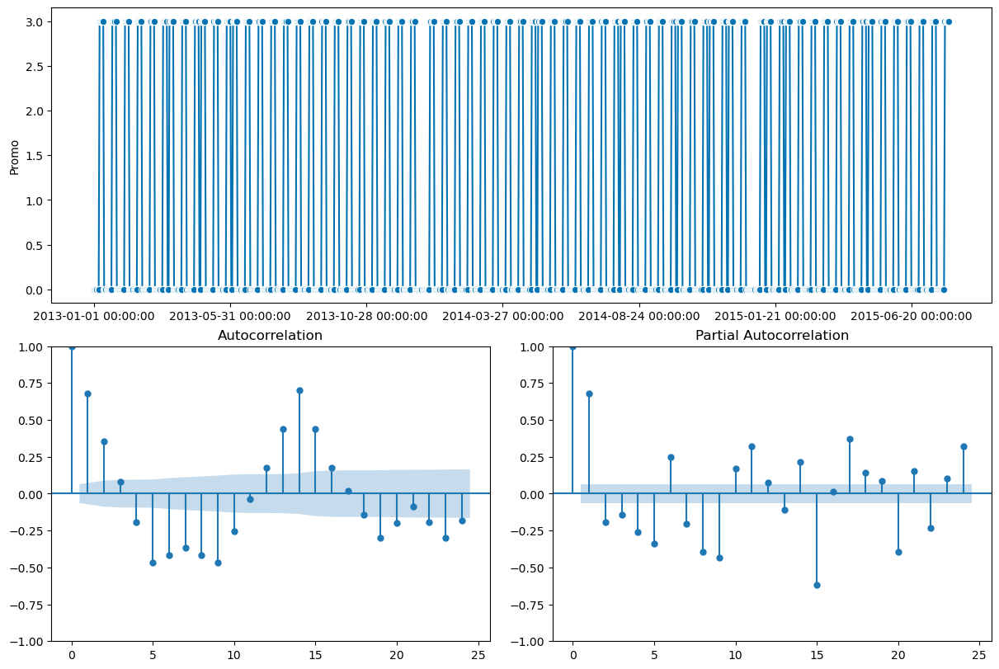

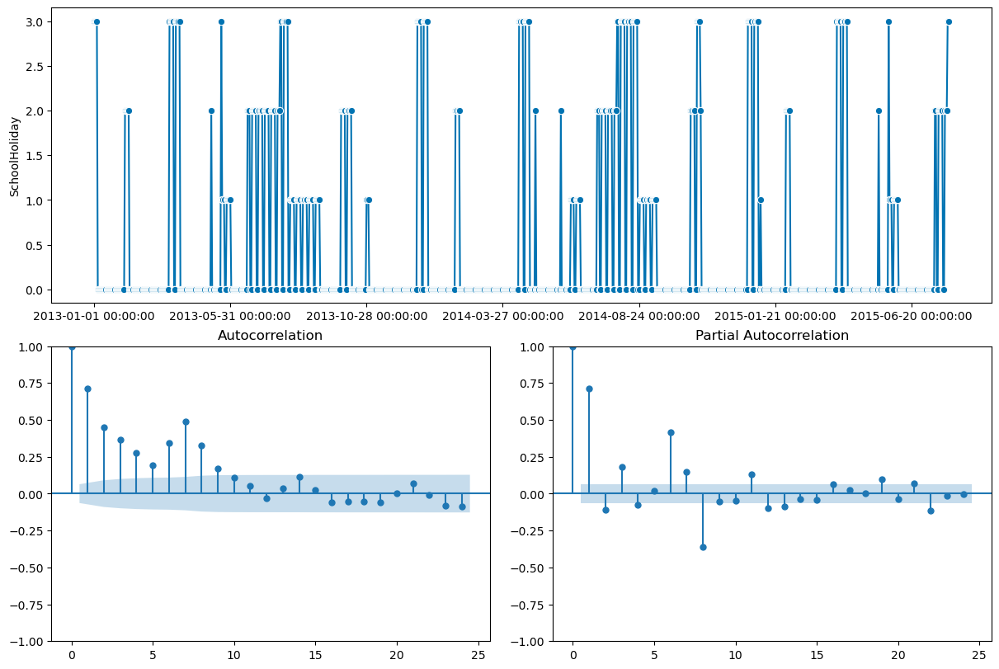

In [83]:
# Graphing while there are 0 values for closed days for 2nd region.
plt.figure(figsize=(15,5))
plot_correlations(df_total2["Sales"],)
plot_correlations(df_total2["Customers"],)
plot_correlations(df_total2["Promo"],)
plot_correlations(df_total2["SchoolHoliday"],)

### Zona 3

(<Figure size 1200x800 with 3 Axes>,
 array([<AxesSubplot:ylabel='SchoolHoliday'>,
        <AxesSubplot:title={'center':'Autocorrelation'}>,
        <AxesSubplot:title={'center':'Partial Autocorrelation'}>],
       dtype=object))

<Figure size 1500x500 with 0 Axes>

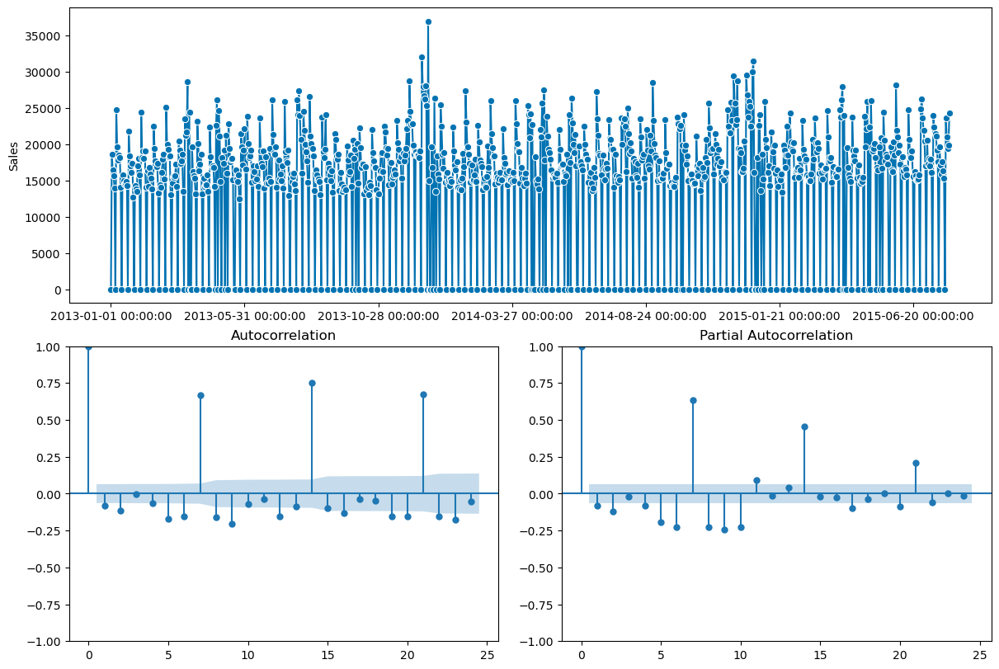

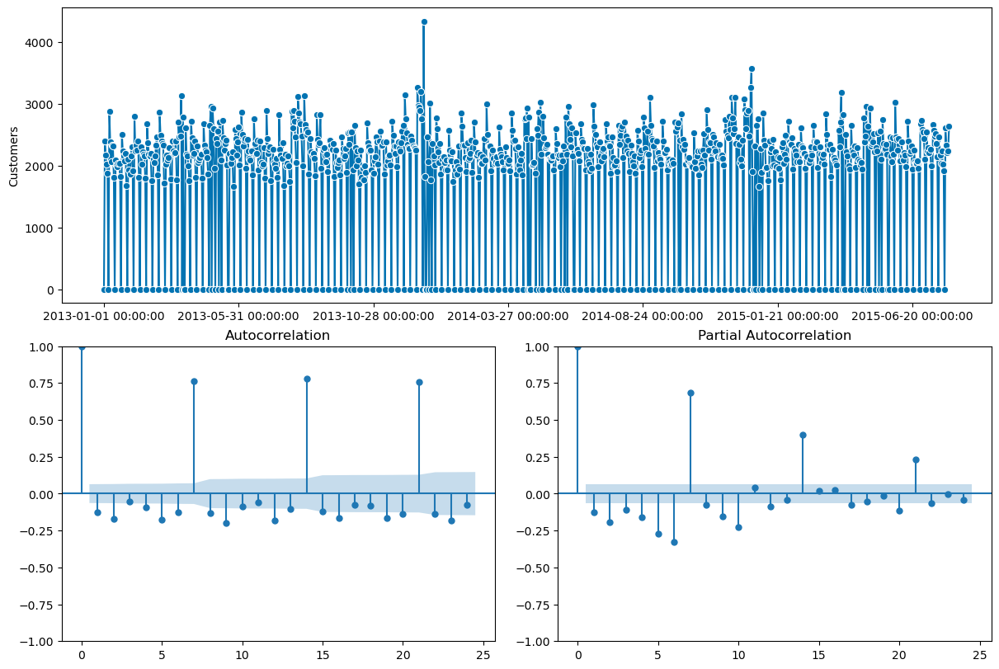

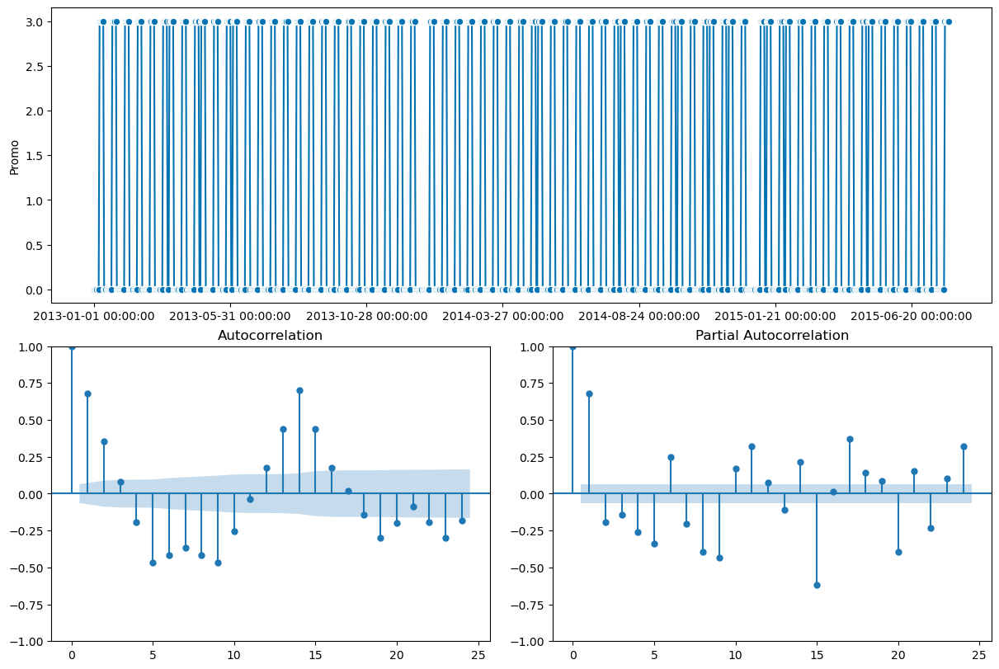

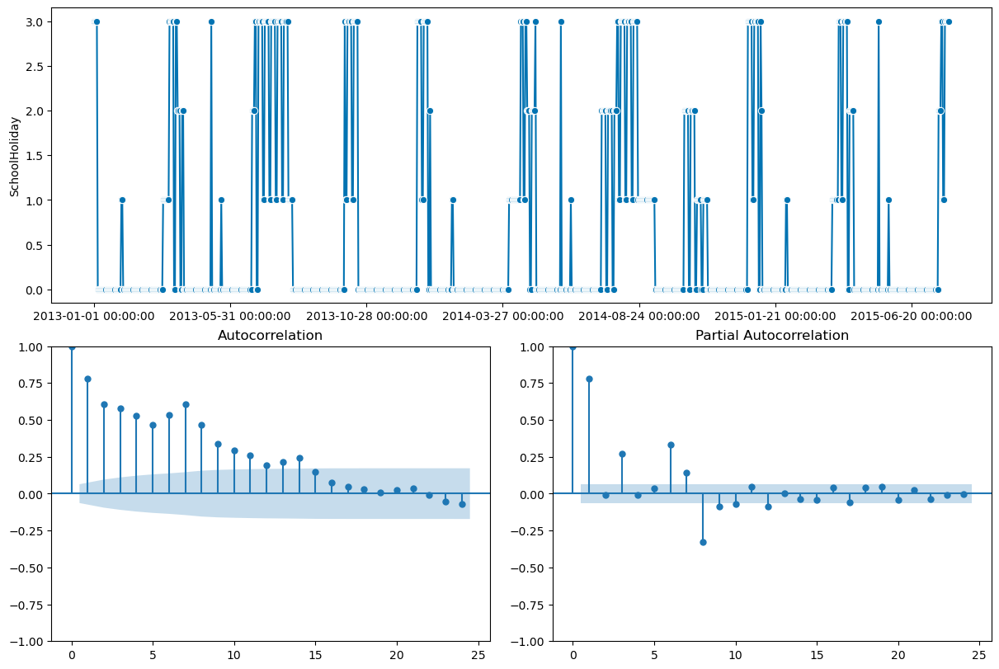

In [84]:
# Graphing while there are 0 values for closed days for 3rd region.
warnings.filterwarnings('ignore')
plt.figure(figsize=(15,5))
plot_correlations(df_total3_["Sales"],)
plot_correlations(df_total3_["Customers"],)
plot_correlations(df_total3_["Promo"],)
plot_correlations(df_total3_["SchoolHoliday"],)

## 3. Graficar las ventas totales diarias. 

In [51]:
#We group the data daily
data_day = data.groupby('Date').sum()
data_day

,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday
Date,,,,,,,
2013-01-01,20,0,0,0,0,10,10
2013-01-02,30,61926,7490,9,0,0,10
2013-01-03,40,53588,6650,9,0,0,10
2013-01-04,50,56578,6784,9,0,0,10
2013-01-05,60,54938,6747,9,0,0,0
...,...,...,...,...,...,...,...
2015-07-27,10,95402,9030,10,10,0,8
2015-07-28,20,82582,8048,10,10,0,8
2015-07-29,30,78795,7851,10,10,0,8


## 4. Graficar las ventas totales semanales.

In [53]:
data_week = data_day.resample('w').sum()
data_week

,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday
2013-01-06,270,227030,27671,36,0,12,40
2013-01-13,280,395390,45616,54,50,0,0
2013-01-20,280,305576,38441,54,0,0,0
2013-01-27,280,372581,42715,54,50,0,0
2013-02-03,280,335998,41099,54,0,0,2
...,...,...,...,...,...,...,...
2015-07-05,280,531819,52828,60,50,0,5
2015-07-12,280,419561,46853,60,0,0,5
2015-07-19,280,501709,51321,60,50,0,11
2015-07-26,280,389502,43589,60,0,0,39


(<Figure size 1200x800 with 3 Axes>,
 array([<AxesSubplot:ylabel='SchoolHoliday'>,
        <AxesSubplot:title={'center':'Autocorrelation'}>,
        <AxesSubplot:title={'center':'Partial Autocorrelation'}>],
       dtype=object))

<Figure size 1500x500 with 0 Axes>

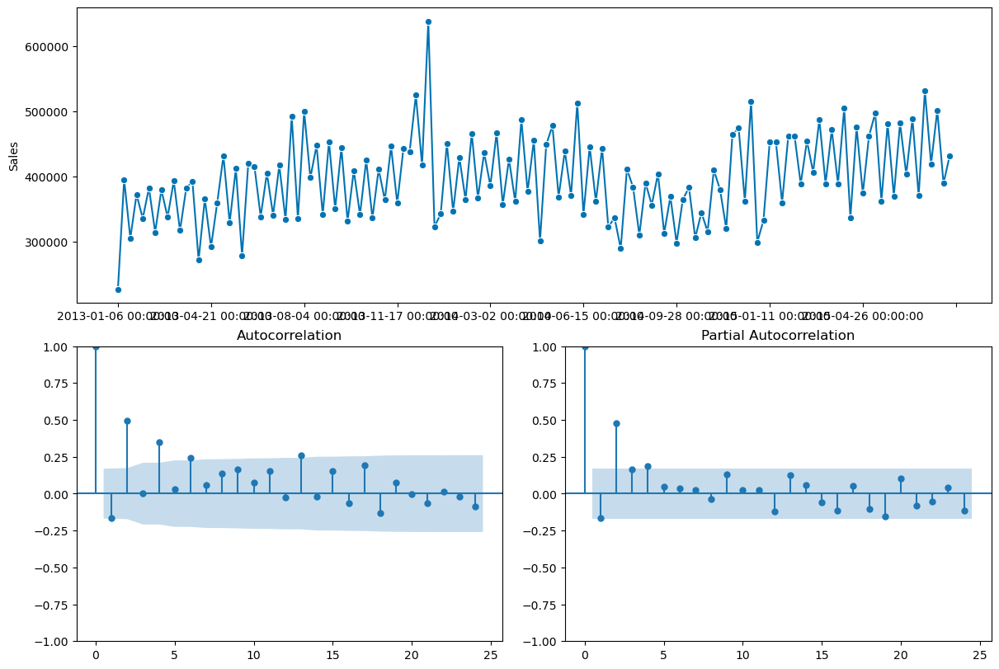

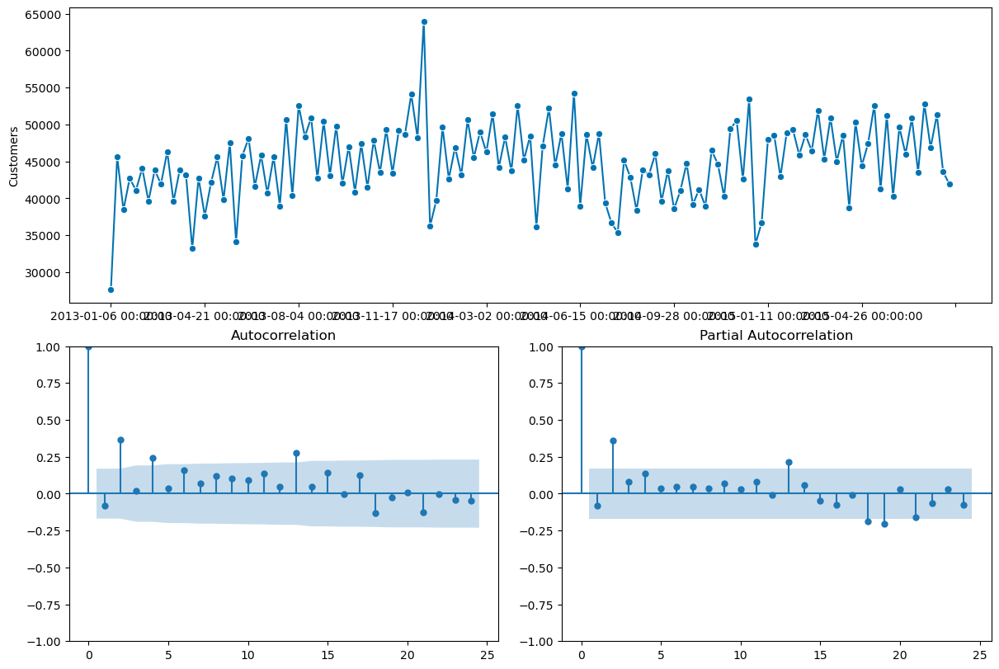

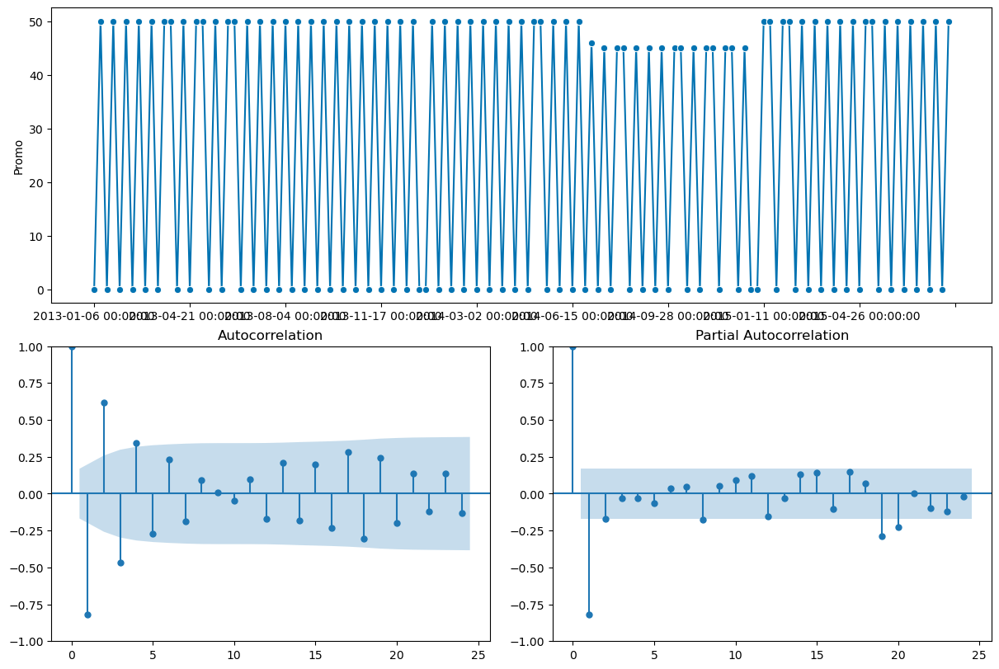

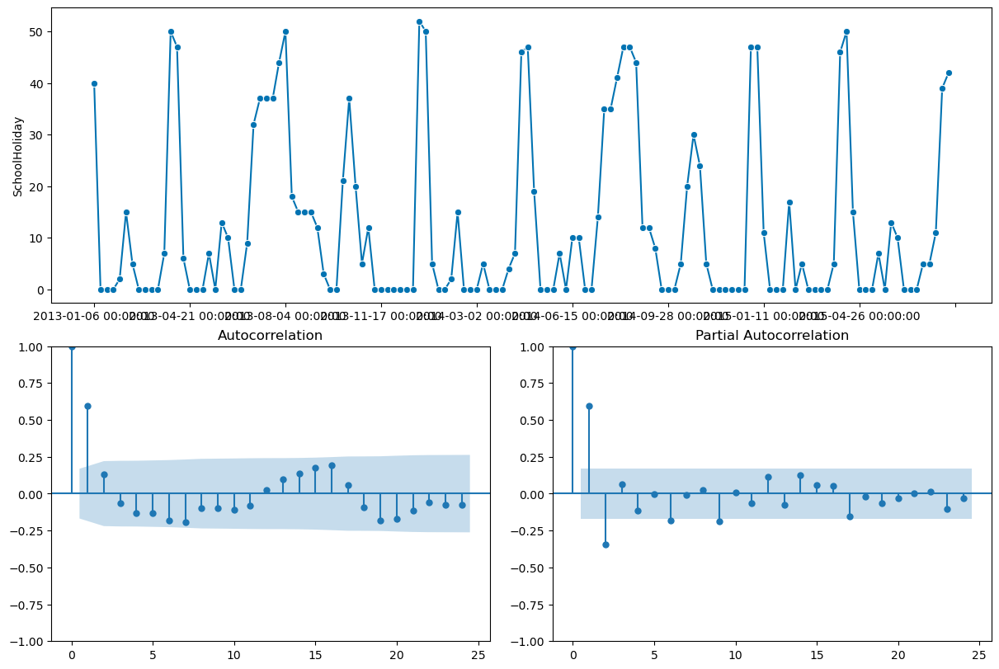

In [54]:
warnings.filterwarnings('ignore')
plt.figure(figsize=(15,5))
plot_correlations(data_week["Sales"],)
plot_correlations(data_week["Customers"],)
plot_correlations(data_week["Promo"],)
plot_correlations(data_week["SchoolHoliday"],)

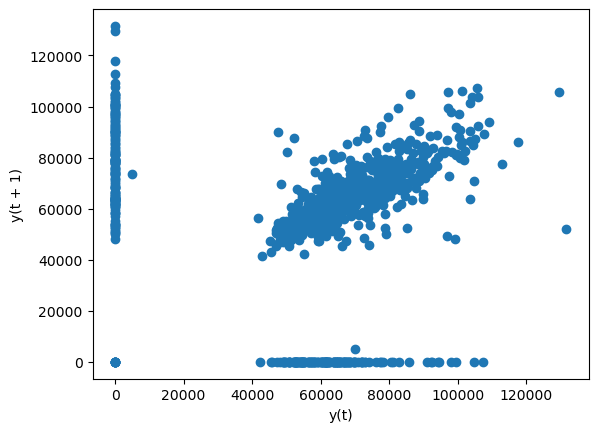

In [56]:
from pandas.plotting import lag_plot
lag_plot(data_day['Sales'],)
plt.show()

Con datos diarios, podemos observar, valores tienen lag con periodo anterior, los varores 0s corresponden a los dias de descanso pero aparte podemos observar una relacion casí directa con observacion anterior.

Finalmente, como tenemos un series de tipo multivariable, quiero ver como cambia los variables. Economicamente, ventas cambia con numero de clientes entra y disponibilidad de tienda. Ademas, promocion puede también aumentar las ventas.

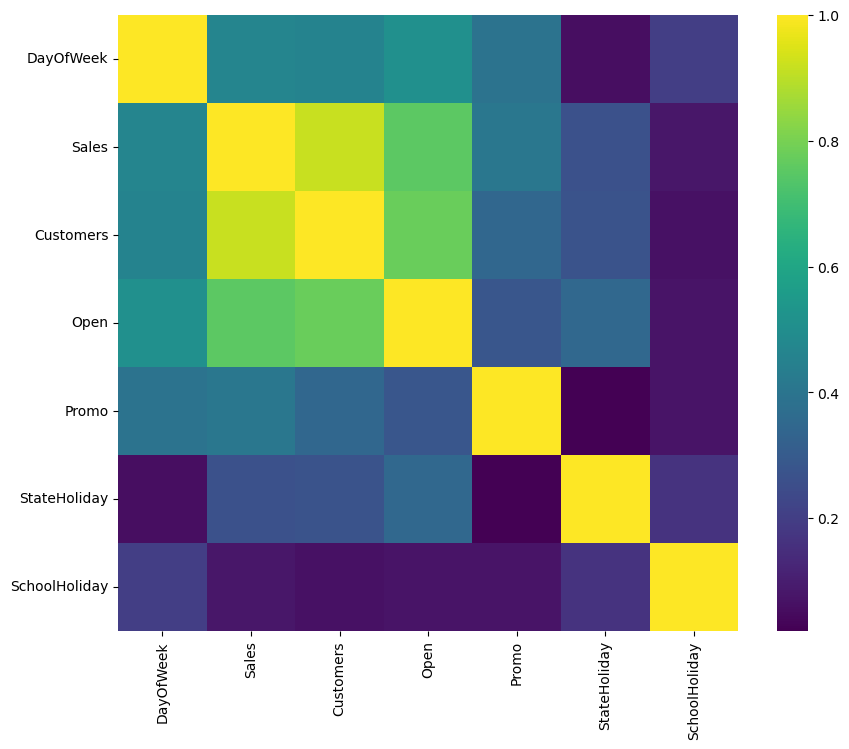

In [57]:
corr_num = data.corr(method = 'pearson')

plt.figure(figsize = (10, 8))
sns.heatmap(corr_num.abs(), cmap ='viridis' )
plt.show()

Variables customers, promociones y disponibilidad en tienda tiene correlacion alto con Ventas incluiso en un contexto sin tiempo.  Por eso habra que utilizar un modelo multivariante.

Hemos encontrado que hay estacionaridad semanal también, segun ACF, PACF y correlacion heatmap, diariamente las ventas cambia.

Customers y Sales tienen mas o menos mismo rutina, más clientes, más ventas. Eso se puede observar tambien mirando los series en general y observando ACF, PACF. 

'SchoolHoliday' tiene casi 0 impact en ventas. 

Vamos a ver los modelos en otro notebook. Pero no queremos tratar los datos otra vez. Por eso, guardamos los dataframes por total semanal y total diaria en csv para hacer modelos en otro notebook.

Mirando las graficas, no se puede comentar mucho sobre estacionaridad mensual o anual, porque para annual hay poco datos y por mensual, no se ve muy bien en grafico.


In [ ]:
data_day.to_csv('../data/datos_diarios.csv')
data_week.to_csv('../data/datos_semanales.csv')